In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!unzip gdrive/My\ Drive/VQA-Med-Train


Archive:  gdrive/My Drive/VQA-Med-Train.zip
   creating: ImageClef-2019-VQA-Med-Training/
  inflating: ImageClef-2019-VQA-Med-Training/All_QA_Pairs_train.txt  
  inflating: ImageClef-2019-VQA-Med-Training/train_ImageIDs.txt  
   creating: ImageClef-2019-VQA-Med-Training/Train_images/
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic27944.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic18635.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic28603.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic24684.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic21681.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic17734.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic59158.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic46205.jpg  
  inflating: ImageClef-2019-VQA-Med-Training/Train_images/synpic53801.jpg  
  inflating: ImageClef-2019-VQA

In [3]:
!unzip gdrive/My\ Drive/VQA-Med-Val

Archive:  gdrive/My Drive/VQA-Med-Val.zip
   creating: ImageClef-2019-VQA-Med-Validation/
  inflating: ImageClef-2019-VQA-Med-Validation/All_QA_Pairs_val.txt  
  inflating: ImageClef-2019-VQA-Med-Validation/val_ImageIDs.txt  
  inflating: ImageClef-2019-VQA-Med-Validation/.DS_Store  
   creating: ImageClef-2019-VQA-Med-Validation/QAPairsByCategory/
  inflating: ImageClef-2019-VQA-Med-Validation/QAPairsByCategory/C2_Plane_val.txt  
  inflating: ImageClef-2019-VQA-Med-Validation/QAPairsByCategory/C1_Modality_val.txt  
  inflating: ImageClef-2019-VQA-Med-Validation/QAPairsByCategory/C3_Organ_val.txt  
  inflating: ImageClef-2019-VQA-Med-Validation/QAPairsByCategory/C4_Abnormality_val.txt  
   creating: ImageClef-2019-VQA-Med-Validation/Val_images/
  inflating: ImageClef-2019-VQA-Med-Validation/Val_images/synpic48351.jpg  
  inflating: ImageClef-2019-VQA-Med-Validation/Val_images/synpic43576.jpg  
  inflating: ImageClef-2019-VQA-Med-Validation/Val_images/synpic59005.jpg  
  inflating: Imag

In [4]:
import tensorflow as tf
from tensorflow.keras.layers import Input, LSTM, Dense, Embedding, Dropout, Activation, Flatten, Reshape, Concatenate, Multiply, Lambda, Add, RepeatVector, Permute, Bidirectional, TimeDistributed
from tensorflow.keras.models import Model
encoder_cnn = tf.keras.applications.resnet_rs.ResNetRS50(include_top=False, weights='imagenet', input_shape=(224,224,3))
encoder_cnn.trainable = True
intermediate_layer = encoder_cnn.get_layer('BlockGroup4__block_5__output_act')

img_regions_layer = tf.keras.layers.Reshape((196,1024))(intermediate_layer.output)

dense_layer = tf.keras.layers.Dense(1024, activation='relu',trainable = True)(img_regions_layer)
dropout_layer = tf.keras.layers.Dropout(0.5)(dense_layer)
latent_dim = 1024
embedding_dim = 100
vocab_size = 99
max_len = 11


encoder_inputs = Input(shape=(max_len,))
enc_emb = Embedding(99, embedding_dim, trainable=True)(encoder_inputs)
encoder_lstm = LSTM(latent_dim,return_sequences=True,return_state=True,dropout=0.2,recurrent_dropout=0.2,trainable = True)
(encoder_outputs,state_h,state_c) = encoder_lstm(enc_emb)

class Attention(tf.keras.layers.Layer):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.WI_A = Dense(units, activation='tanh',use_bias = False)
        self.WQ_A = Dense(units, activation='tanh',use_bias = True)
        self.attention = tf.keras.layers.Attention(use_scale=True , trainable = True)
        self.denseLayer = Dense(units,activation = 'relu',trainable = True)
        self.addLayer = tf.keras.layers.Add()

    def call(self, features, hidden):
        expanded_question = tf.expand_dims(hidden, axis=1)  # (batch_size, 1, 1024)
        attention_scores = self.attention([features, expanded_question])
        attended_features = tf.reduce_sum(attention_scores * features, axis=1)
        merged_vector = self.addLayer([attended_features, hidden])
        return merged_vector


attention_layer = Attention(1024)

refined_query = attention_layer(dropout_layer, state_h)



decoder_inputs = Input(shape=(None,))
dec_emb_layer = Embedding(1985, embedding_dim, trainable=True)
dec_emb = dec_emb_layer(decoder_inputs)
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True,dropout=0.2,recurrent_dropout=0.2)
(decoder_outputs, _, _) = decoder_lstm(dec_emb, initial_state=[refined_query, refined_query])

decoder_dense = TimeDistributed(Dense(1985, activation='softmax'))
decoder_outputs = decoder_dense(decoder_outputs)

model = Model([encoder_inputs,encoder_cnn.input, decoder_inputs], decoder_outputs)

model.summary()



135360144/135360144 [==============================] - 1s 0us/step


(None, 1024)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          0         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 226, 226, 3)          0         ['normalizati

In [5]:
# CONVERT THE TEXT FILE SEPERATED BY | TO A DATAFRAME
import pandas as pd
import numpy as np
import json
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

file_path = './VQA-Med-Training/All_QA_Pairs_train.txt'
with open(file_path, 'r') as file:
    lines = file.readlines()
data_list = [line.strip().split('|') for line in lines]
train_qa_df = pd.DataFrame(data_list, columns=['image', 'question', 'answer'])

file_path = './VQA-Med-Validation/All_QA_Pairs_val.txt'
with open(file_path, 'r') as file:
    lines = file.readlines()

data_list = [line.strip().split('|') for line in lines]

val_qa_df = pd.DataFrame(data_list, columns=['image', 'question', 'answer'])



In [7]:
import nltk
nltk.download('stopwords')
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.text import Tokenizer

import string
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))

from sklearn.model_selection import train_test_split

# import spacy
from time import time
import numpy as np

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:

import re

def text_strip(sentence):
    sentence = re.sub("(//t)", ' ', str(sentence)).lower()
    sentence = re.sub("(//r)", ' ', str(sentence)).lower()
    sentence = re.sub("(//n)", ' ', str(sentence)).lower()
    sentence = re.sub("(__+)", ' ', str(sentence)).lower()
    sentence = re.sub("(--+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\.\.+)", ' ', str(sentence)).lower()
    sentence = re.sub(r"[<>()|&©ø\[\]\'\",;?~*!]", ' ', str(sentence)).lower()
    sentence = re.sub(r"(\\x9\d)", ' ', str(sentence)).lower()
    sentence = re.sub("([cC][mM]\d+)|([cC][hH][gG]\d+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\.\s+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\-\s+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\:\s+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\?\s+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\s+.\s+)", ' ', str(sentence)).lower()
    sentence = re.sub("(\s+)", ' ', str(sentence)).lower()
    return sentence


<ipython-input-9-9a94308a496e>:18: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_qa_df['question_len'],kde=False,bins=50,color='blue')


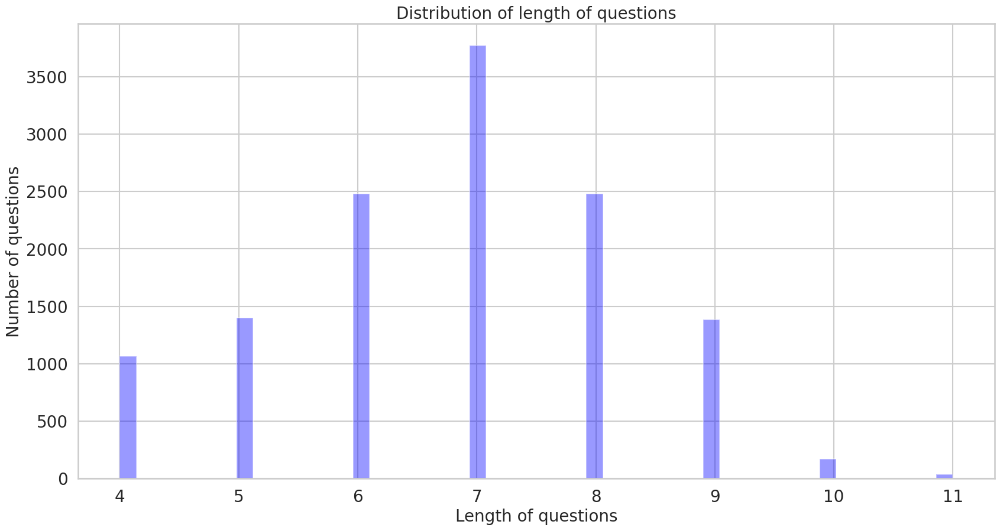

<ipython-input-9-9a94308a496e>:28: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_qa_df['answer_len'],kde=False,bins=50,color='red')


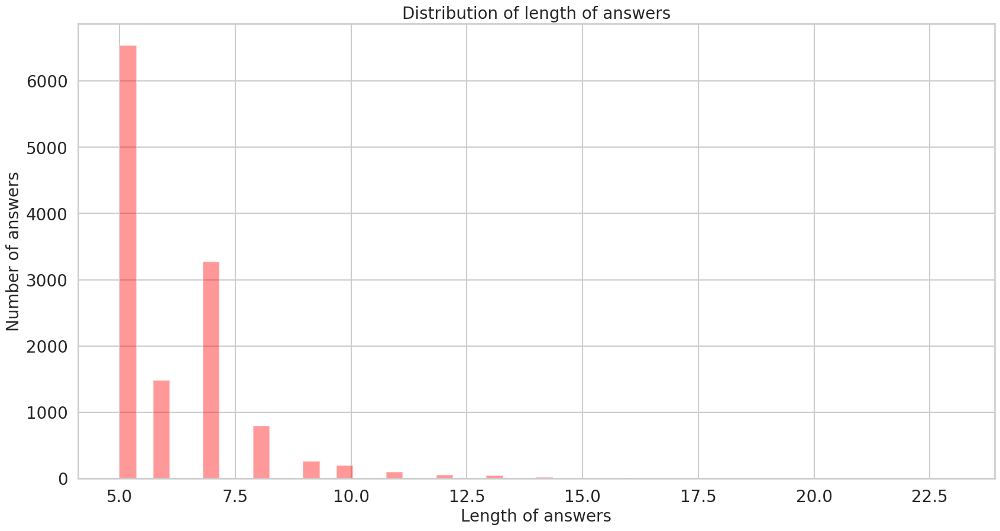

count    12792.000000
mean         6.800422
std          1.461771
min          4.000000
25%          6.000000
50%          7.000000
75%          8.000000
max         11.000000
Name: question_len, dtype: float64
count    12792.000000
mean         6.122342
std          1.553153
min          5.000000
25%          5.000000
50%          5.000000
75%          7.000000
max         23.000000
Name: answer_len, dtype: float64
Number of questions with length greater than 11:  0
Number of answers with length greater than 15:  23


<ipython-input-9-9a94308a496e>:54: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(val_qa_df['question_len'],kde=False,bins=50,color='blue')


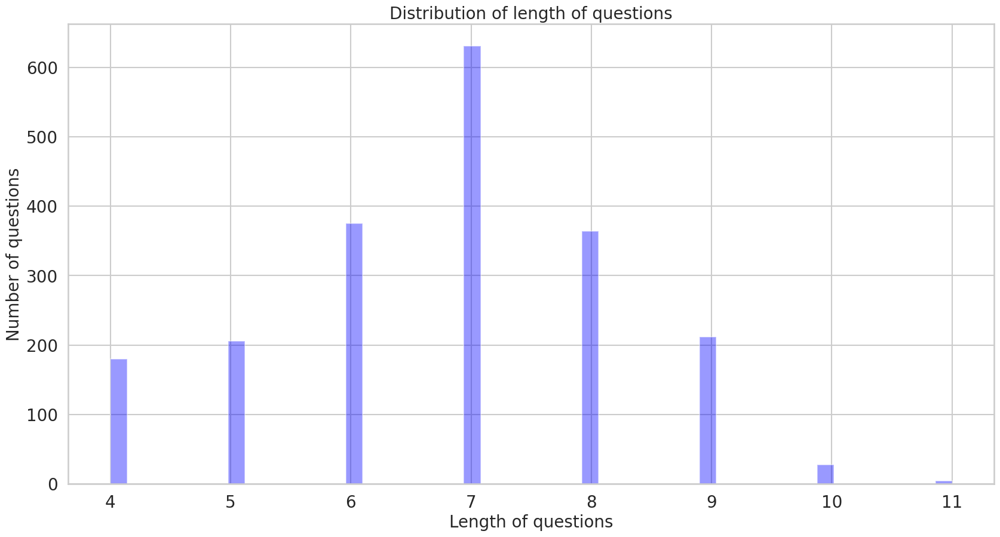

<ipython-input-9-9a94308a496e>:64: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(val_qa_df['answer_len'],kde=False,bins=50,color='red')


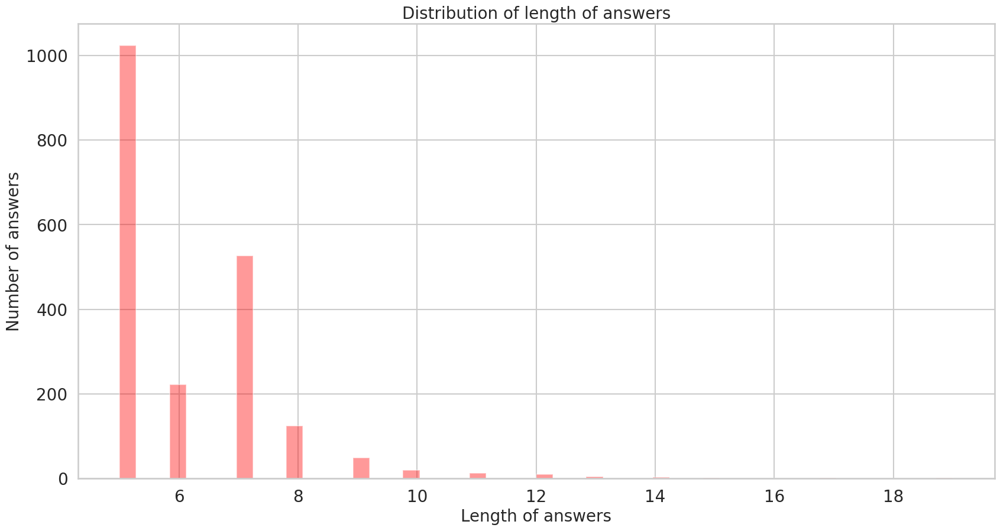

count    2000.000000
mean        6.780500
std         1.458212
min         4.000000
25%         6.000000
50%         7.000000
75%         8.000000
max        11.000000
Name: question_len, dtype: float64
count    2000.000000
mean        6.102500
std         1.489665
min         5.000000
25%         5.000000
50%         5.000000
75%         7.000000
max        19.000000
Name: answer_len, dtype: float64
Number of questions with length greater than 11:  4
Number of answers with length greater than 15:  3


In [9]:
train_qa_df["cleaned_question"] = train_qa_df["question"].apply(lambda x: text_strip(x))
train_qa_df["cleaned_answer"] = train_qa_df["answer"].apply(lambda x: '_START_ '+ text_strip(x) + ' _END_')
train_qa_df["cleaned_answer"] = train_qa_df["cleaned_answer"].apply(lambda x: 'sostok '+x+' eostok')

val_qa_df["cleaned_question"] = val_qa_df["question"].apply(lambda x: text_strip(x))
val_qa_df["cleaned_answer"] = val_qa_df["answer"].apply(lambda x: '_START_ '+ text_strip(x) + ' _END_')
val_qa_df["cleaned_answer"] = val_qa_df["cleaned_answer"].apply(lambda x: 'sostok '+x+' eostok')
#know the distribution of length of questions and answers
train_qa_df['question_len'] = train_qa_df['cleaned_question'].apply(lambda x:len(x.split()))
train_qa_df['answer_len'] = train_qa_df['cleaned_answer'].apply(lambda x:len(x.split()))

#plot the distribution of length of questions and answers
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
sns.set_context('talk')
plt.figure(figsize=(20, 10))
sns.distplot(train_qa_df['question_len'],kde=False,bins=50,color='blue')
plt.title('Distribution of length of questions', fontsize=20)
plt.xlabel('Length of questions', fontsize=20)
plt.ylabel('Number of questions', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()


plt.figure(figsize=(20, 10))
sns.distplot(train_qa_df['answer_len'],kde=False,bins=50,color='red')
plt.title('Distribution of length of answers', fontsize=20)
plt.xlabel('Length of answers', fontsize=20)
plt.ylabel('Number of answers', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

print(train_qa_df['question_len'].describe())

print(train_qa_df['answer_len'].describe())

print('Number of questions with length greater than 11: ',len(train_qa_df[train_qa_df['question_len']>11]))

print('Number of answers with length greater than 15: ',len(train_qa_df[train_qa_df['answer_len']>15]))

#know the distribution of length of questions and answers
val_qa_df['question_len'] = val_qa_df['cleaned_question'].apply(lambda x:len(x.split()))
val_qa_df['answer_len'] = val_qa_df['cleaned_answer'].apply(lambda x:len(x.split()))

#plot the distribution of length of questions and answers
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
sns.set_context('talk')
plt.figure(figsize=(20, 10))
sns.distplot(val_qa_df['question_len'],kde=False,bins=50,color='blue')
plt.title('Distribution of length of questions', fontsize=20)
plt.xlabel('Length of questions', fontsize=20)
plt.ylabel('Number of questions', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()


plt.figure(figsize=(20, 10))
sns.distplot(val_qa_df['answer_len'],kde=False,bins=50,color='red')
plt.title('Distribution of length of answers', fontsize=20)
plt.xlabel('Length of answers', fontsize=20)
plt.ylabel('Number of answers', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()


print(val_qa_df['question_len'].describe())


print(val_qa_df['answer_len'].describe())


print('Number of questions with length greater than 11: ',len(val_qa_df[val_qa_df['question_len']>=11]))

print('Number of answers with length greater than 15: ',len(val_qa_df[val_qa_df['answer_len']>15]))



In [11]:

post_qa = train_qa_df[((train_qa_df.cleaned_question.str.split().str.len() <= 11) &
                       (train_qa_df.cleaned_answer.str.split().str.len() <= 15))].copy()
post_qa = post_qa.reset_index(drop=True)

post_qa = post_qa.drop(['question_len','answer_len','question','answer'],axis=1)

post_qa = post_qa.rename(columns = {'cleaned_question' : 'question', 'cleaned_answer' : 'answer'})

post_val_qa = val_qa_df[((val_qa_df.cleaned_question.str.split().str.len() <= 11) &
                       (val_qa_df.cleaned_answer.str.split().str.len() <= 15))].copy()
post_val_qa = post_val_qa.reset_index(drop=True)

post_val_qa = post_val_qa.drop(['question_len','answer_len','question','answer'],axis=1)
post_val_qa = post_val_qa.rename(columns = {'cleaned_question' : 'question', 'cleaned_answer' : 'answer'})


In [12]:
def get_rare_words(text_col):
    text_tokenizer = Tokenizer()
    text_tokenizer.fit_on_texts(list(text_col))
    thresh = 2
    cnt = 0
    tot_cnt = 0

    for key, value in text_tokenizer.word_counts.items():
        tot_cnt = tot_cnt + 1
        if value < thresh:
            cnt = cnt + 1

    print("% of rare words in vocabulary:",(cnt/tot_cnt)*100)
    return cnt, tot_cnt

In [13]:
x_train_rare, x_train_tot = get_rare_words(post_qa['question'])
x_tokenizer = Tokenizer(num_words=x_train_tot)
x_tokenizer.fit_on_texts(list(post_qa['question']))

x_train_seq = x_tokenizer.texts_to_sequences(post_qa['question'])
x_val_seq = x_tokenizer.texts_to_sequences(post_val_qa['question'])
x_train_pad = pad_sequences(x_train_seq,  maxlen=11, padding='post')
x_val_pad = pad_sequences(x_val_seq, maxlen=11, padding='post')

x_voc = x_tokenizer.num_words + 1
print("size of vocabulary in X = {}".format(x_voc))
y_train_rare, y_train_tot = get_rare_words(post_qa['answer'])
y_tokenizer = Tokenizer(num_words=y_train_tot)
y_tokenizer.fit_on_texts(list(post_qa['answer']))

y_train_seq = y_tokenizer.texts_to_sequences(post_qa['answer'])
y_val_seq = y_tokenizer.texts_to_sequences(post_val_qa['answer'])
y_train_pad = pad_sequences(y_train_seq, maxlen=11, padding='post')
y_val_pad = pad_sequences(y_val_seq, maxlen=11, padding='post')

y_voc = y_tokenizer.num_words + 1
print("size of vocabulary in Y = {}".format(y_voc))


% of rare words in vocabulary: 0.0
size of vocabulary in X = 99
% of rare words in vocabulary: 34.57661290322581
size of vocabulary in Y = 1985


In [14]:
def lr_schedule(epoch):
    initial_lr = 0.001
    decay = 0.9
    epochs_to_decay = 30
    lr = initial_lr * np.power(decay, epoch // epochs_to_decay)
    return lr

optimizer = tf.keras.optimizers.RMSprop(lr_schedule(0))


model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'] )

model_name = './vqa-medical-inf9.h5'
save_model = ModelCheckpoint(filepath=model_name,
                             save_weights_only=False,
                             save_best_only=True,
                             verbose=1)

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

In [15]:

def get_images(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224 ,3))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.keras.applications.resnet50.preprocess_input(img)
    return img

def get_images_batch(image_path_list):
    batch_images = []
    for image_path in image_path_list:
        batch_images.append(get_images(image_path))
    batch_images = np.array(batch_images)
    return batch_images

def generate_batch(X,train_image_paths,y, batch_size = 16):
    ''' Generate a batch of data '''

    while True:
        for j in range(0, len(X), batch_size):
            encoder_input_data = X[j:j+batch_size]
            img_paths = get_images_batch(train_image_paths[j : j+batch_size])
            target_text = y[j:j+batch_size]
            decoder_input_data = target_text[:,:-1]
            decoder_target_data =target_text.reshape(target_text.shape[0],target_text.shape[1], 1)[:,1:]
            yield [encoder_input_data,img_paths, decoder_input_data], decoder_target_data
batch_size = 32
epochs = 100
train_samples = len(x_train_pad)
val_samples = len(x_val_pad)

train_image_paths = []
for i in post_qa['image']:
    train_image_paths.append('VQA-Med-Training/Train_images/'+i + '.jpg')

val_image_paths = []
for i in post_val_qa['image']:
    val_image_paths.append('VQA-Med-Validation/Val_images/'+i + '.jpg')

history = model.fit_generator(generator=generate_batch(x_train_pad,train_image_paths, y_train_pad, batch_size = batch_size),
                    steps_per_epoch=train_samples//batch_size,
                    epochs=epochs,
                    validation_data=generate_batch(x_val_pad,val_image_paths, y_val_pad, batch_size = batch_size),
                    validation_steps=val_samples//batch_size,
                    callbacks=[save_model, es],
                    verbose=1)


<ipython-input-15-289e3fee1da2>:38: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator=generate_batch(x_train_pad,train_image_paths, y_train_pad, batch_size = batch_size),


Epoch 1/100
399/399 [==============================] - ETA: 0s - loss: 1.1195 - accuracy: 0.5135
Epoch 1: val_loss improved from inf to 1.66924, saving model to ./vqa-medical-inf9.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


399/399 [==============================] - 267s 565ms/step - loss: 1.1195 - accuracy: 0.5135 - val_loss: 1.6692 - val_accuracy: 0.4963
Epoch 2/100
399/399 [==============================] - ETA: 0s - loss: 0.7831 - accuracy: 0.4892
Epoch 2: val_loss improved from 1.66924 to 1.51761, saving model to ./vqa-medical-inf9.h5
399/399 [==============================] - 216s 539ms/step - loss: 0.7831 - accuracy: 0.4892 - val_loss: 1.5176 - val_accuracy: 0.4959
Epoch 3/100
399/399 [==============================] - ETA: 0s - loss: 0.6969 - accuracy: 0.4898
Epoch 3: val_loss improved from 1.51761 to 1.36915, saving model to ./vqa-medical-inf9.h5
399/399 [==============================] - 213s 535ms/step - loss: 0.6969 - accuracy: 0.4898 - val_loss: 1.3692 - val_accuracy: 0.4969
Epoch 4/100
399/399 [==============================] - ETA: 0s - loss: 0.6379 - accuracy: 0.4898
Epoch 4: val_loss improved from 1.36915 to 1.33845, saving model to ./vqa-medical-inf9.h5
399/399 [=========================

In [16]:
# Inference Architecture

encoder_cnn_inference = tf.keras.models.Model(inputs=encoder_cnn.input, outputs=dropout_layer)

encoder_model = Model(encoder_inputs, [encoder_outputs, state_h, state_c])
attention_model = Model([dropout_layer, state_h], refined_query)


decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_hidden_state_input = Input(shape=(max_len,latent_dim))
dec_emb2= dec_emb_layer(decoder_inputs)

(decoder_outputs2, state_h2, state_c2) = decoder_lstm(dec_emb2, initial_state=[decoder_state_input_h, decoder_state_input_c])
decoder_outputs2 = decoder_dense(decoder_outputs2)

decoder_model = Model(
    [decoder_inputs] + [decoder_hidden_state_input,decoder_state_input_h, decoder_state_input_c],
    [decoder_outputs2] + [state_h2, state_c2])



In [17]:
reverse_source_word_index = x_tokenizer.index_word
reverse_target_word_index = y_tokenizer.index_word
target_word_index = y_tokenizer.word_index

In [18]:
def decode_sequence(input_seq,img):
    img = np.expand_dims(img, axis=0)
    image_features = encoder_cnn_inference(img)

    (e_out, e_h, e_c) = encoder_model.predict(input_seq , verbose=0)
    target_seq = np.zeros((1,1))
    target_seq[0,0] = target_word_index['sostok']
    stop_condition = False
    decoded_sentence = ''

    attention_output = attention_model.predict([image_features, e_h], verbose=0)
    v_h = attention_output
    v_c = attention_output

    while not stop_condition:
        (output_seq, h, c) = decoder_model.predict([target_seq] + [e_out,v_h,v_c], verbose=0)
        sampled_token_index = np.argmax(output_seq[0, -1, :])
        sampled_token = reverse_target_word_index[sampled_token_index]

        if (sampled_token != 'eostok'):
            decoded_sentence += ' ' + sampled_token

        if (sampled_token == 'eostok' or len(decoded_sentence.split()) >= (max_len - 1)):
            stop_condition = True

        target_seq = np.zeros((1,1))
        target_seq[0,0] = sampled_token_index

        (v_h, v_c) = (h, c)

    return decoded_sentence

In [19]:

def seq2text(input_seq):
    newString = ''
    for i in input_seq:
        if i!= 0:
            newString = newString + reverse_source_word_index[i] + ' '

    return newString

def seq2summary(input_seq):
    newString = ''
    for i in input_seq:
        if ((i!=0 and i!=target_word_index['sostok']) and i!=target_word_index['eostok']):
            newString = newString + reverse_target_word_index[i] + ' '
    return newString



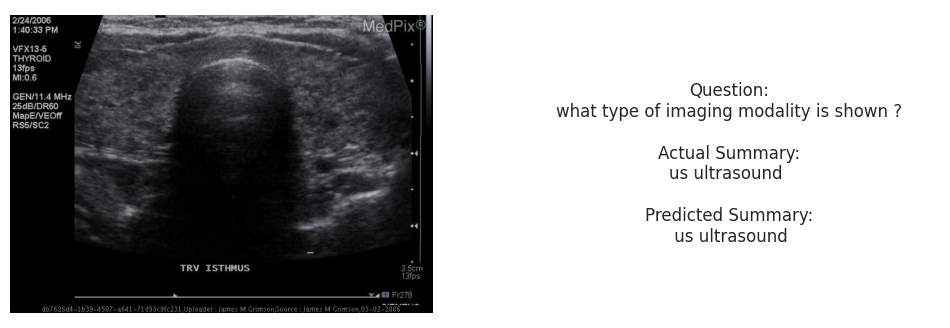

-----------------


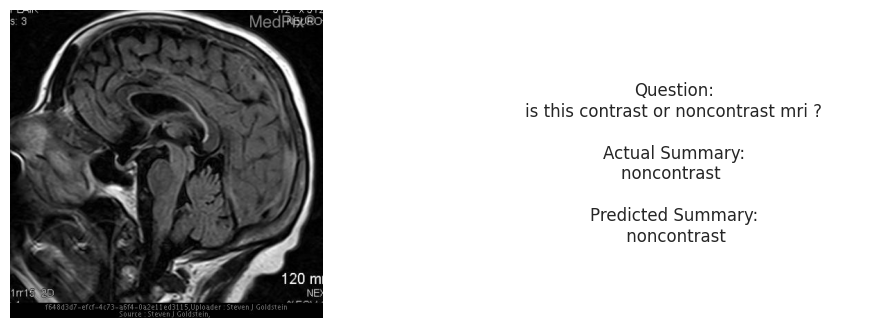

-----------------


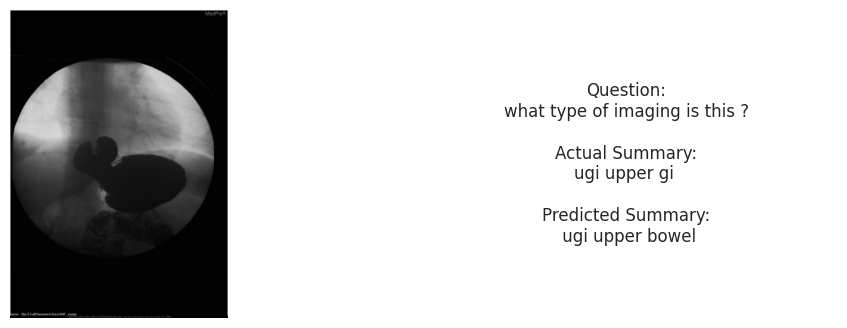

-----------------


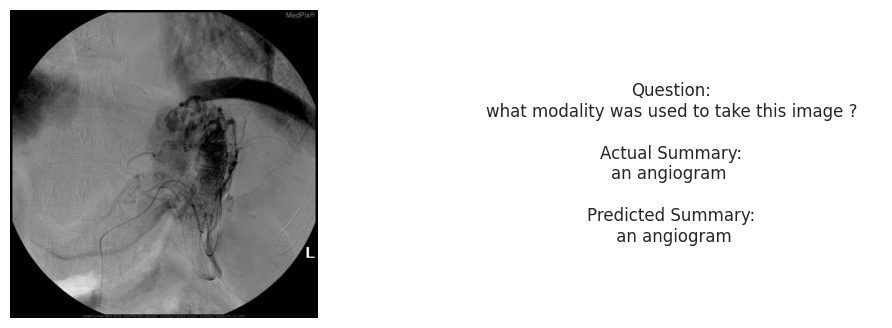

-----------------


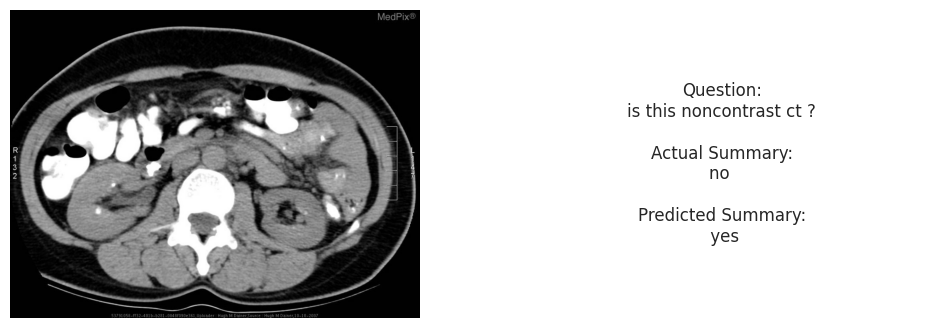

-----------------


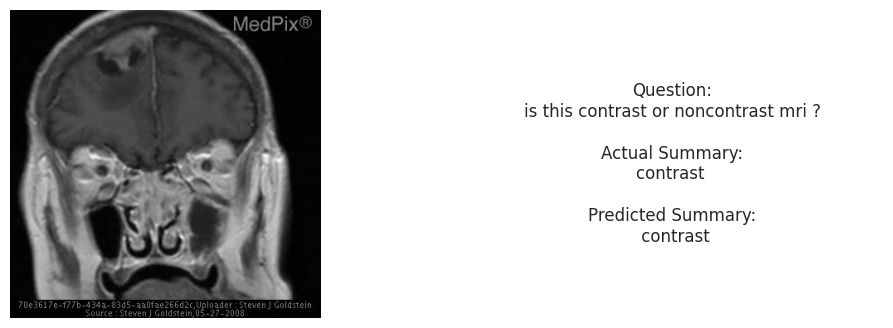

-----------------


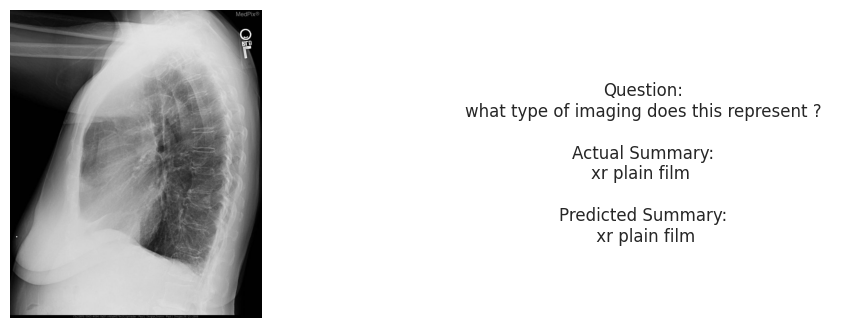

-----------------


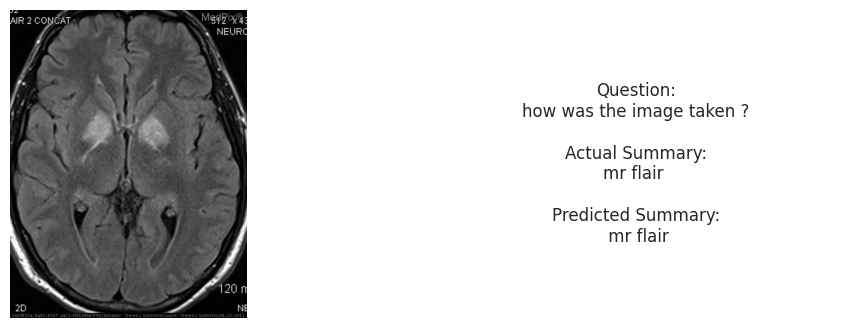

-----------------


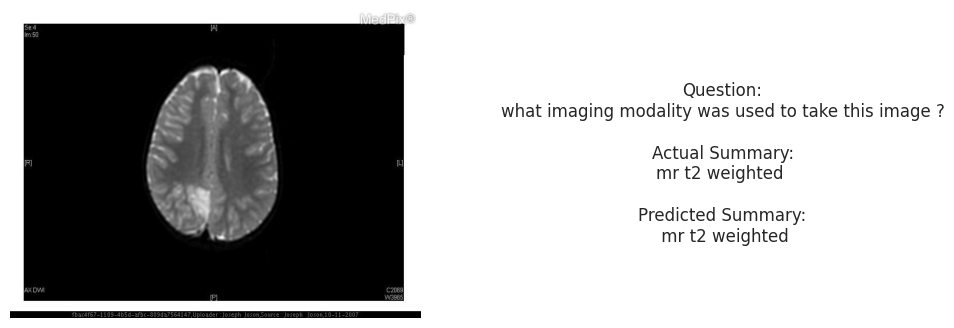

-----------------


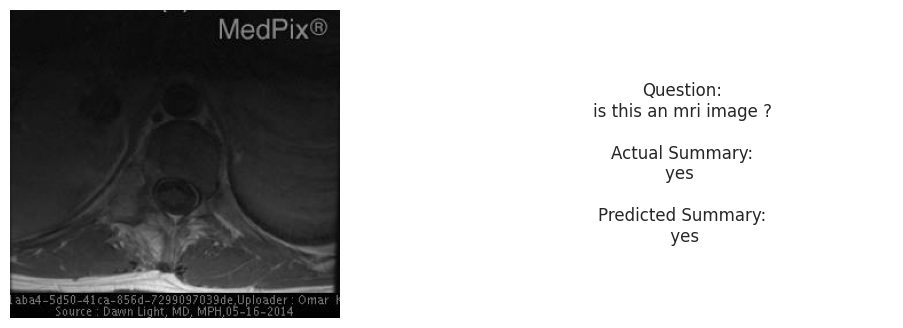

-----------------


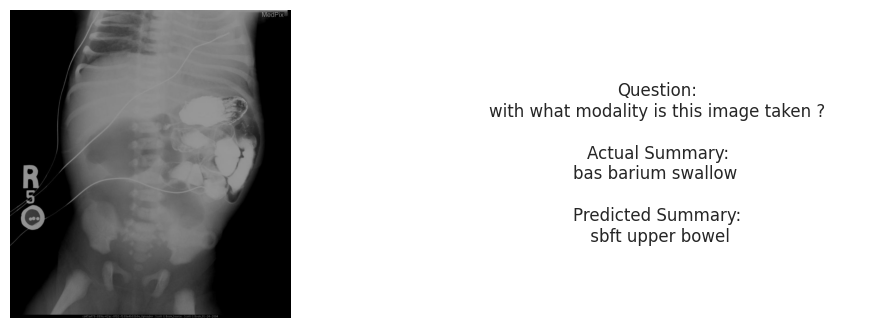

-----------------


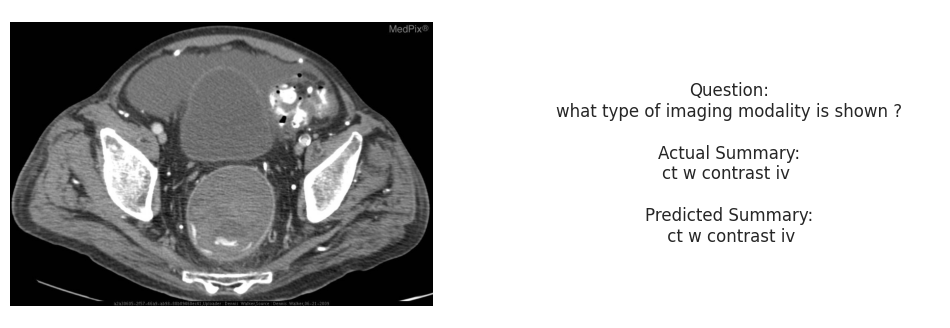

-----------------


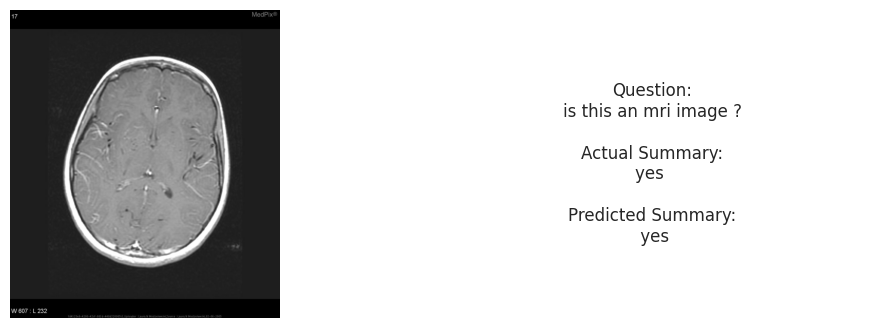

-----------------


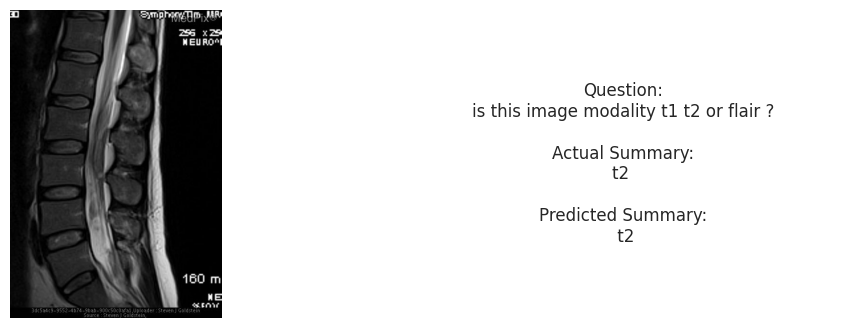

-----------------


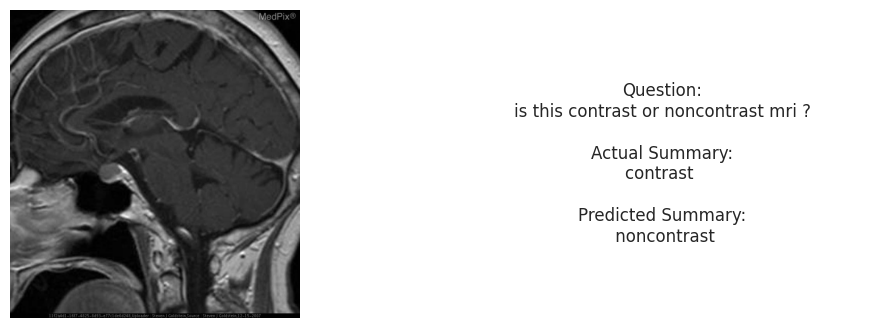

-----------------


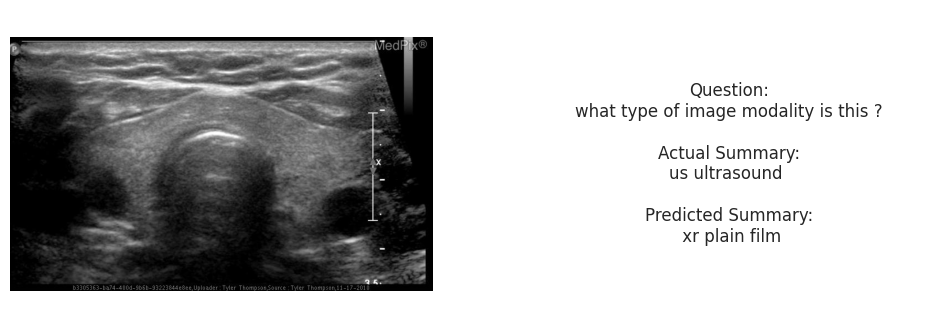

-----------------


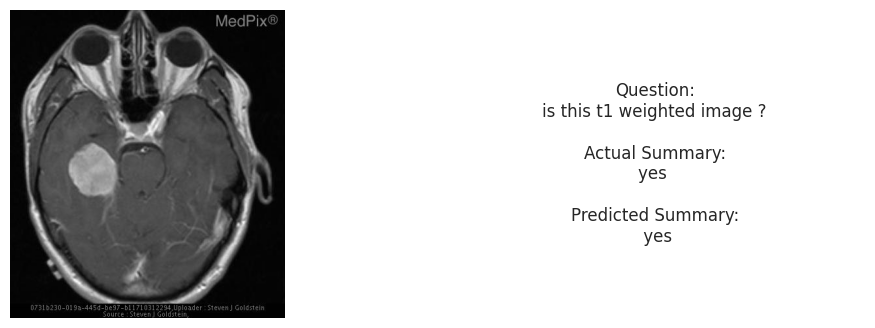

-----------------


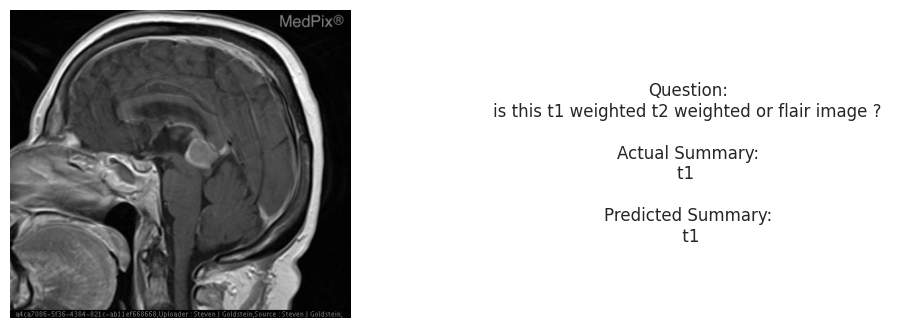

-----------------


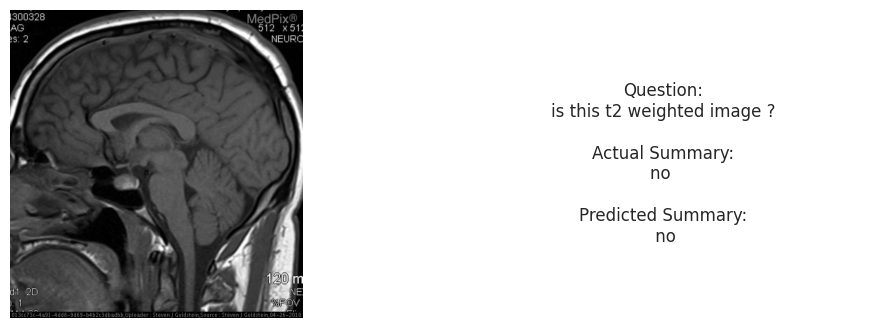

-----------------


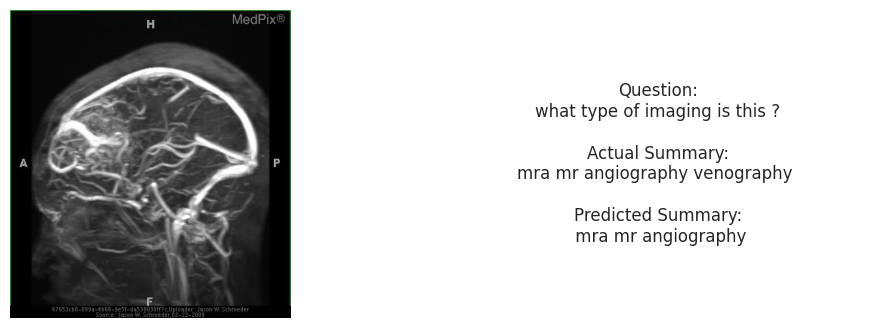

-----------------


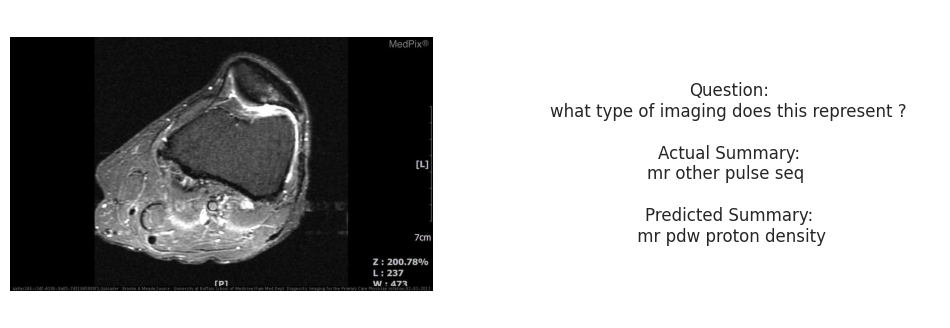

-----------------


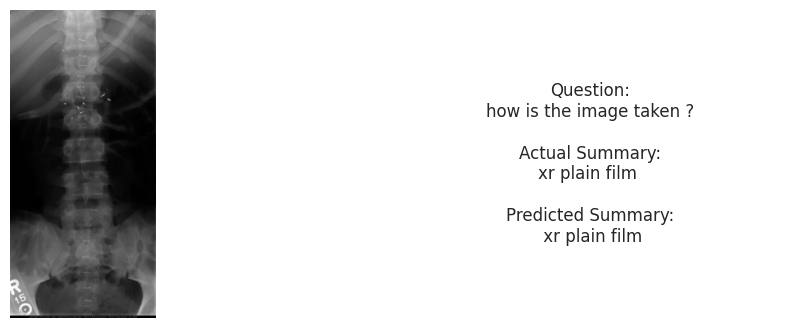

-----------------


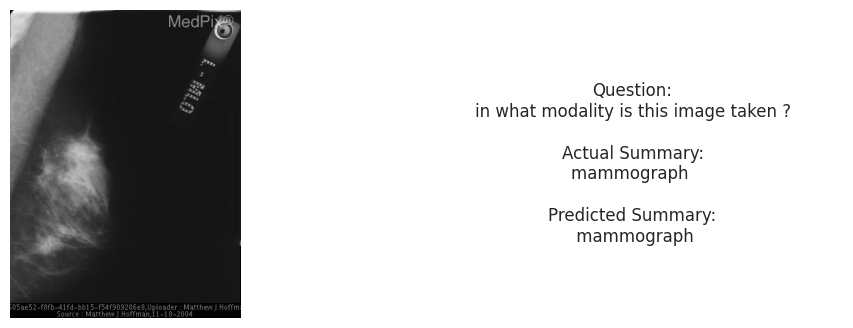

-----------------


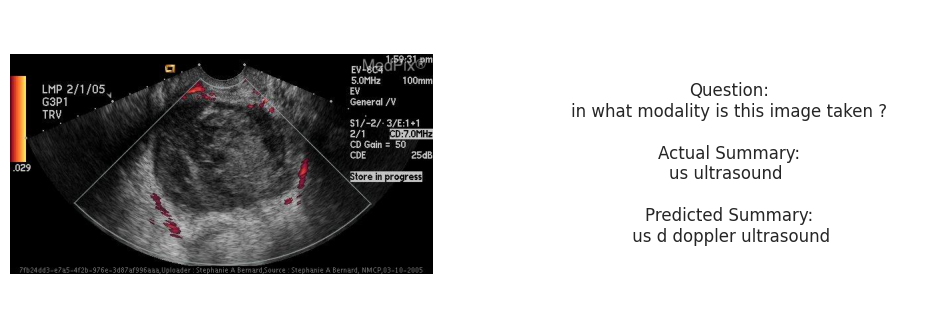

-----------------


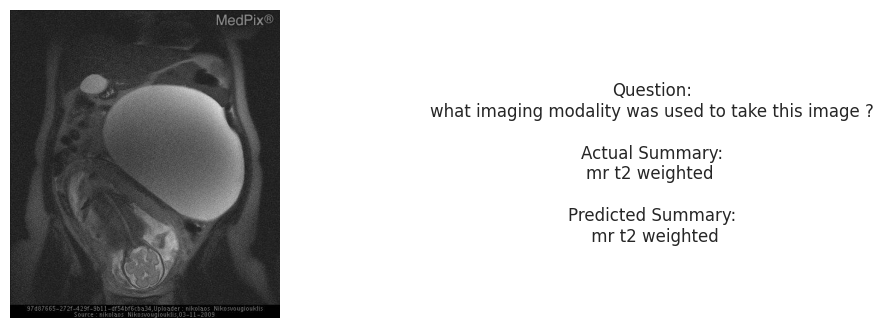

-----------------


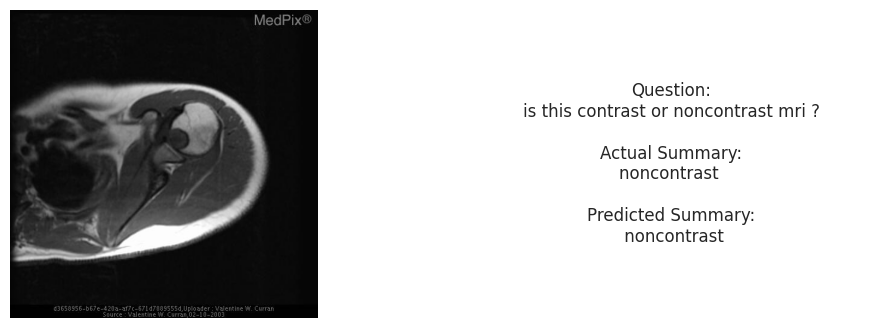

-----------------


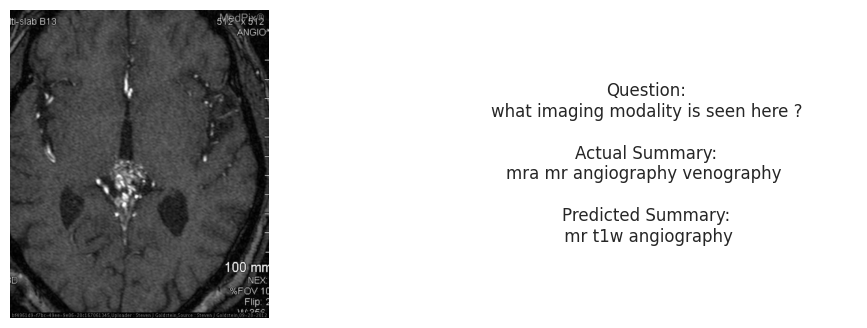

-----------------


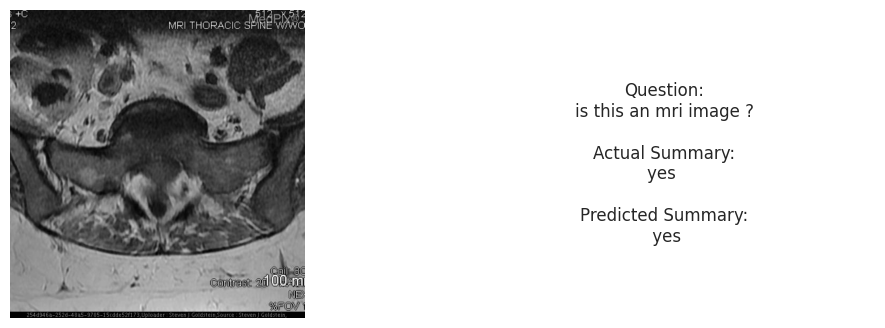

-----------------


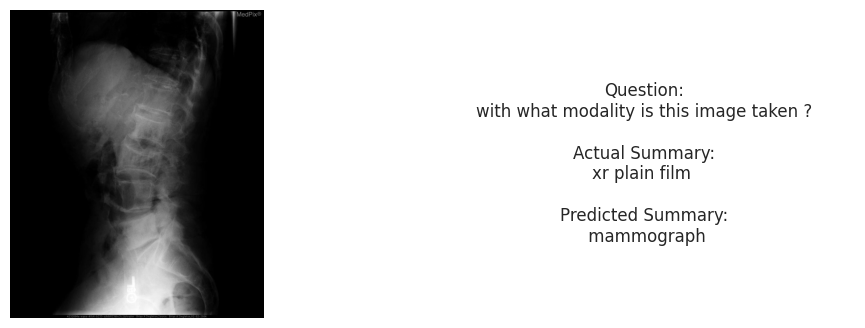

-----------------


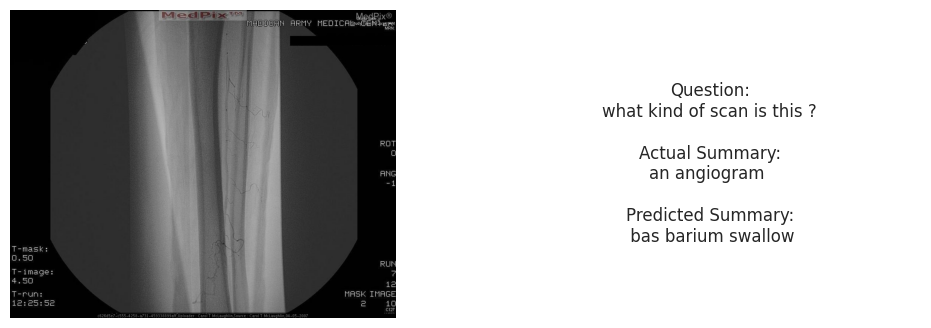

-----------------


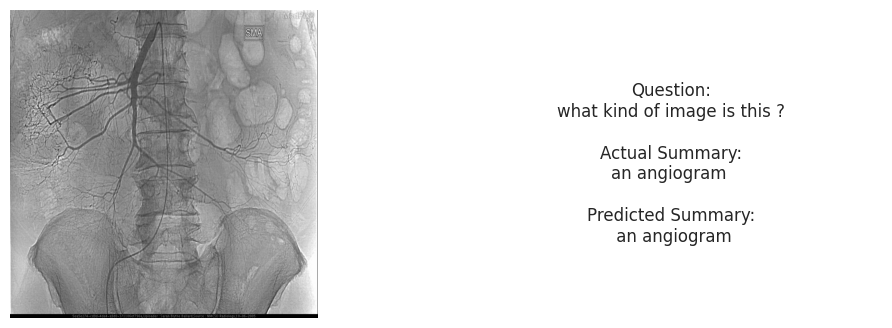

-----------------


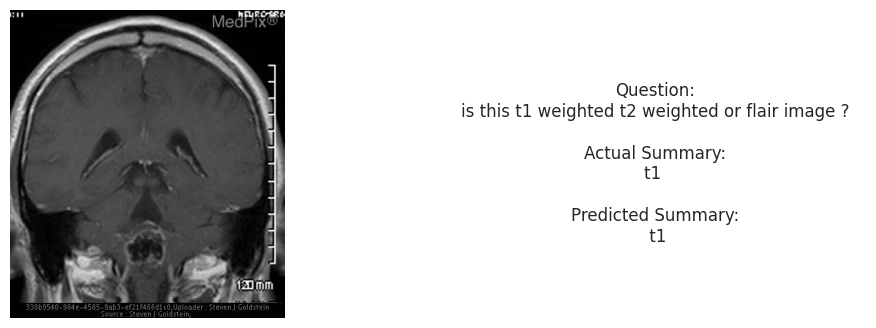

-----------------


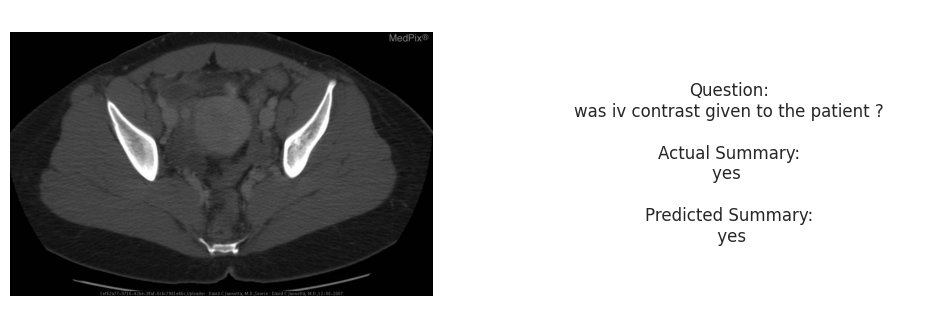

-----------------


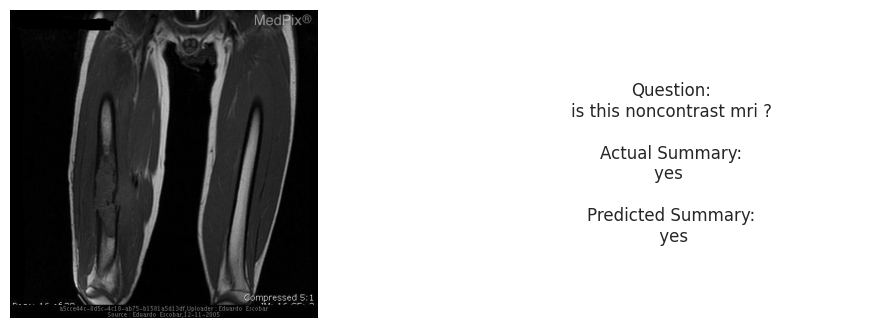

-----------------


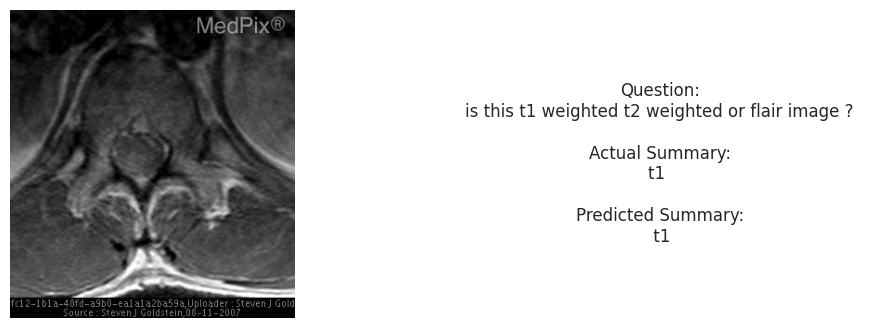

-----------------


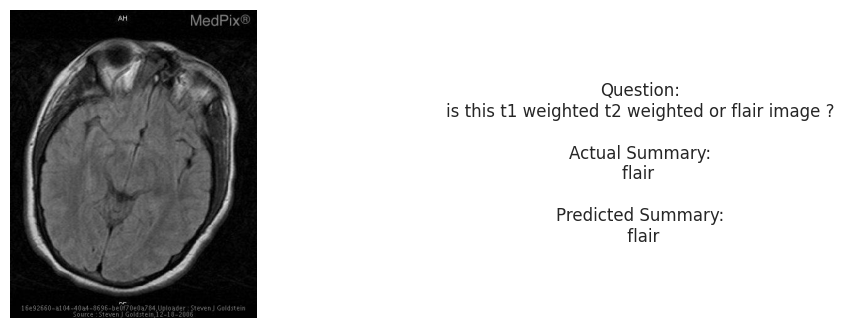

-----------------


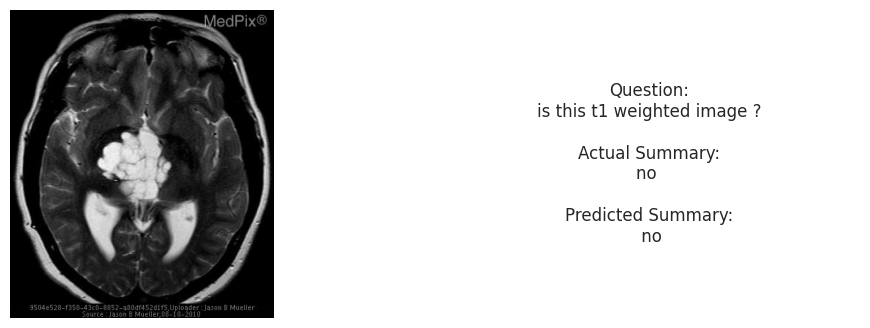

-----------------


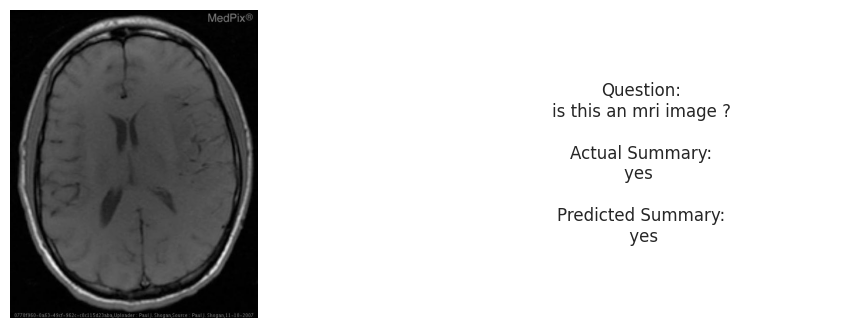

-----------------


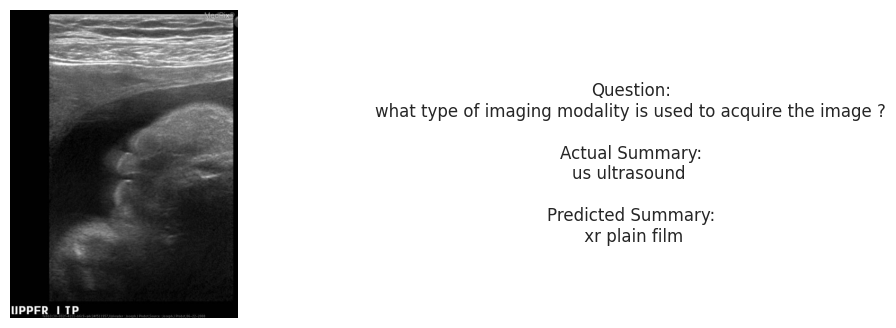

-----------------


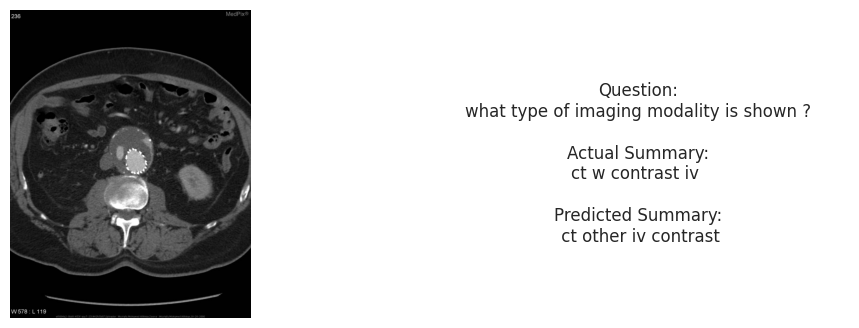

-----------------


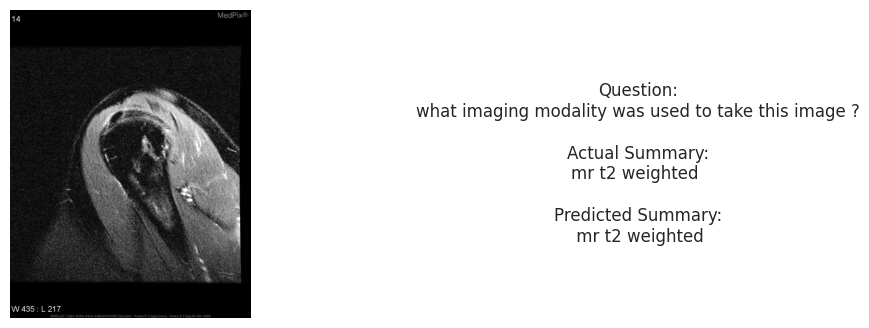

-----------------


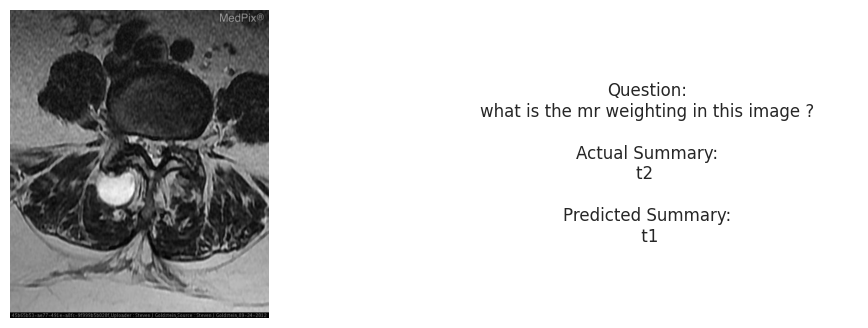

-----------------


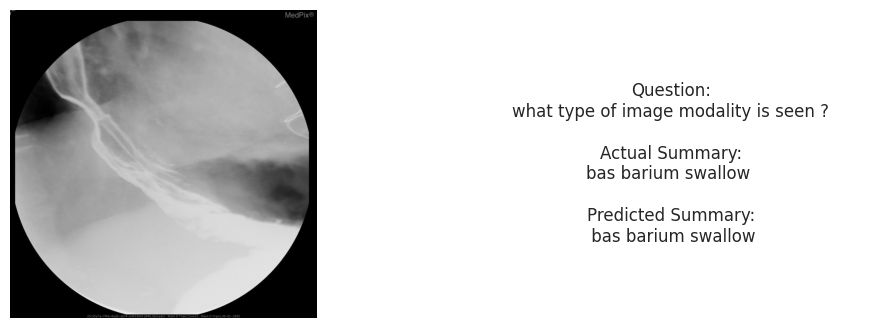

-----------------


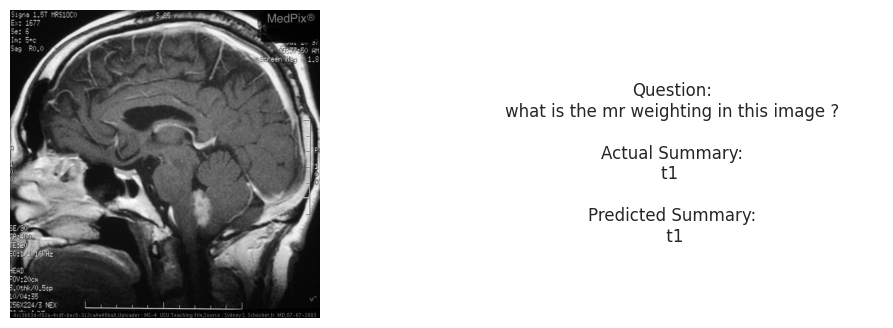

-----------------


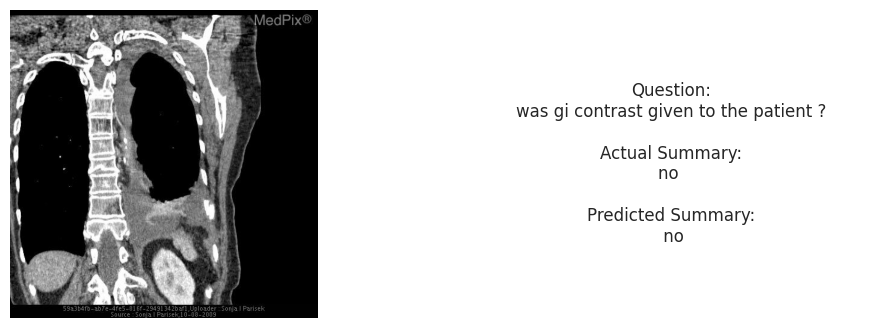

-----------------


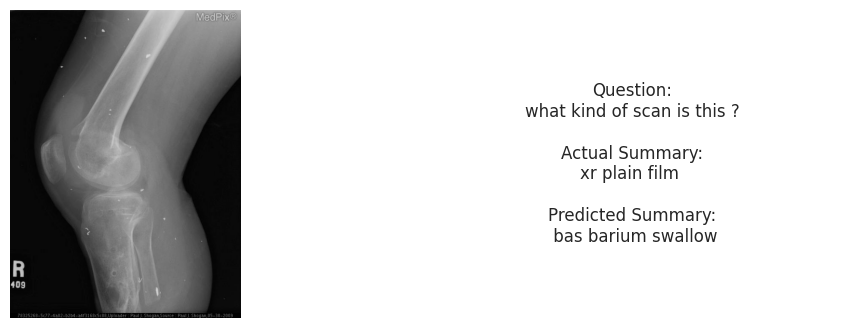

-----------------


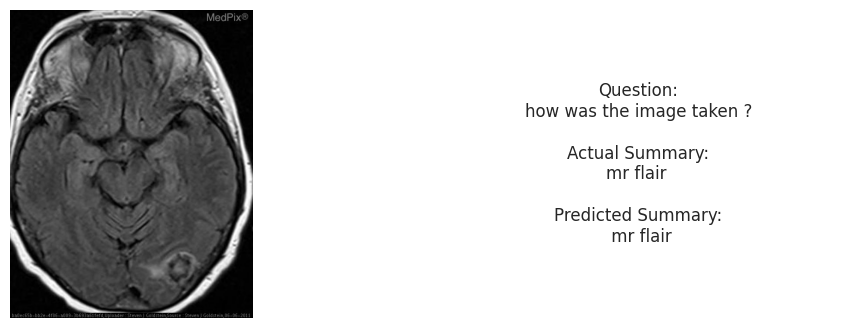

-----------------


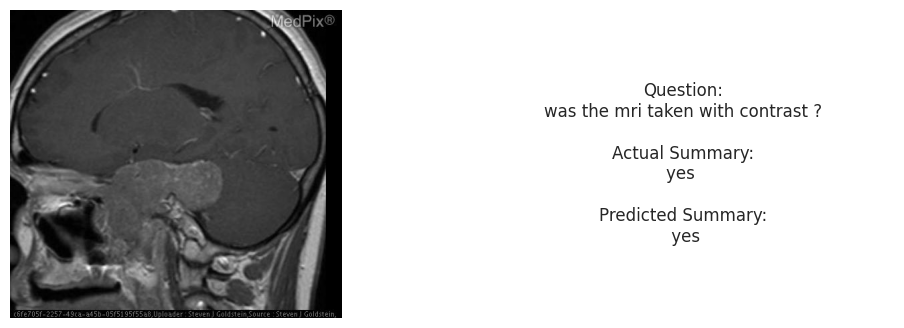

-----------------


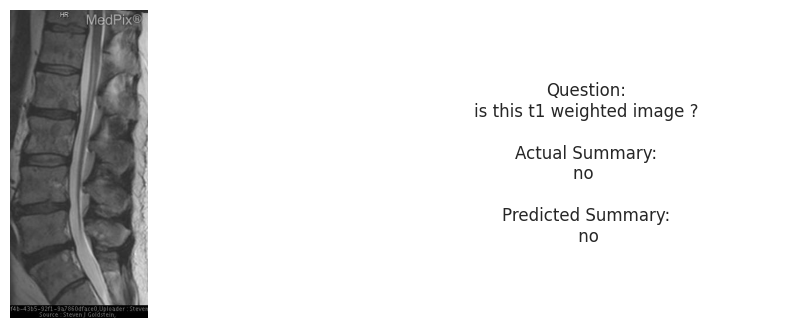

-----------------


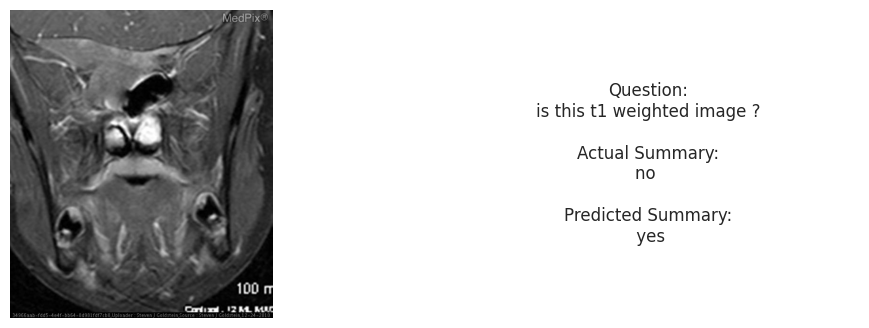

-----------------


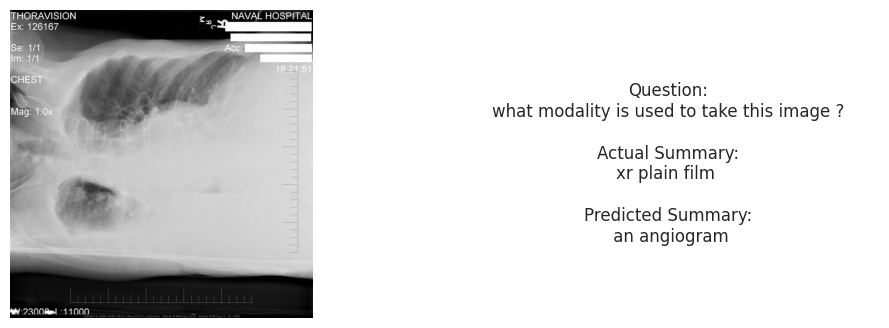

-----------------


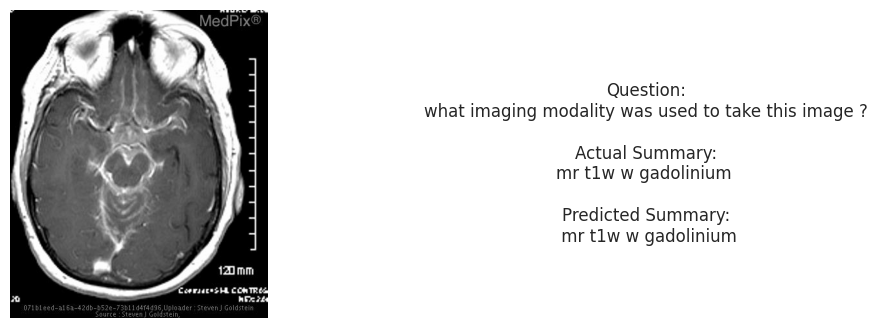

-----------------


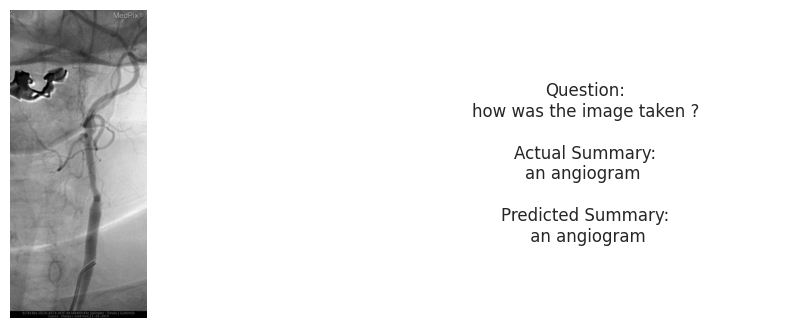

-----------------


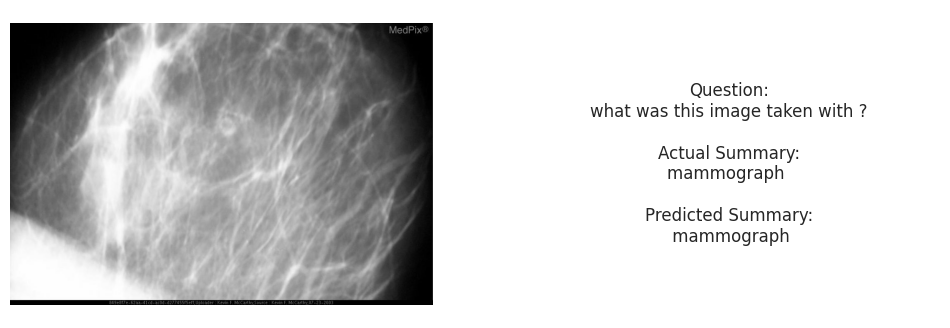

-----------------


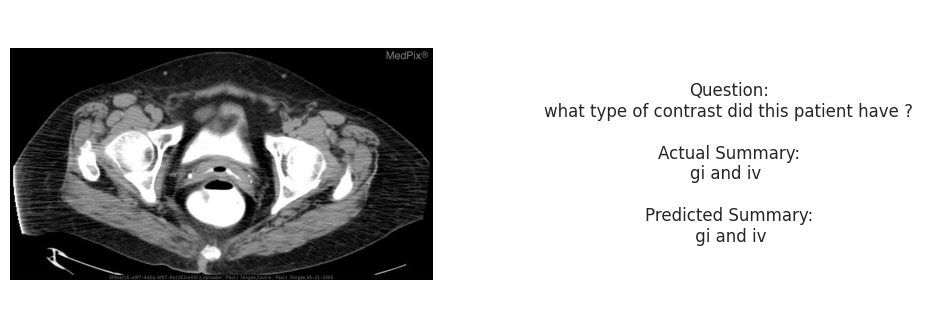

-----------------


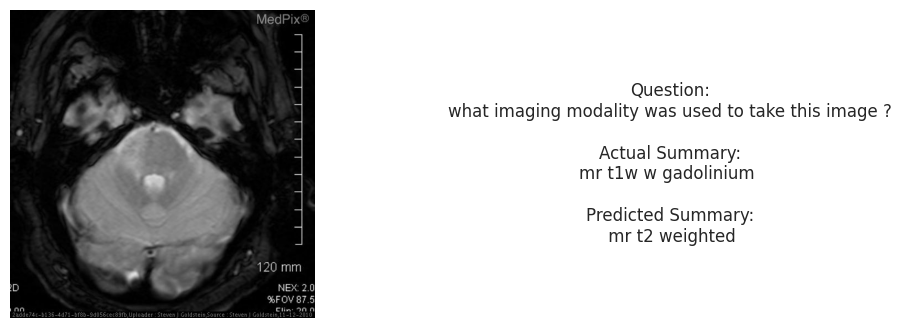

-----------------


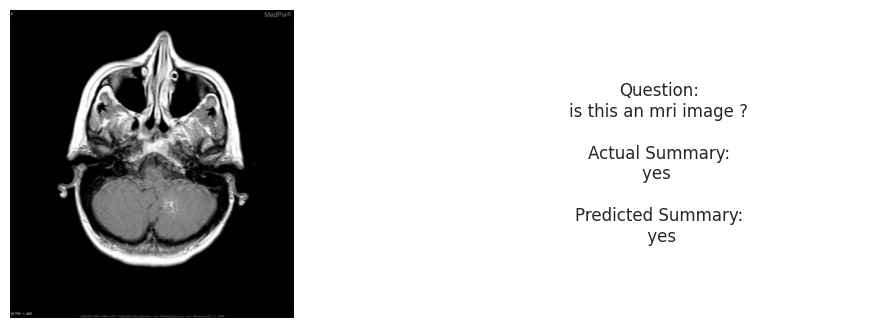

-----------------


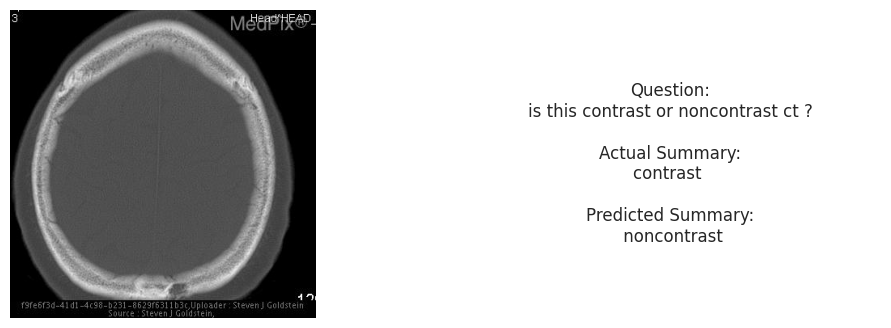

-----------------


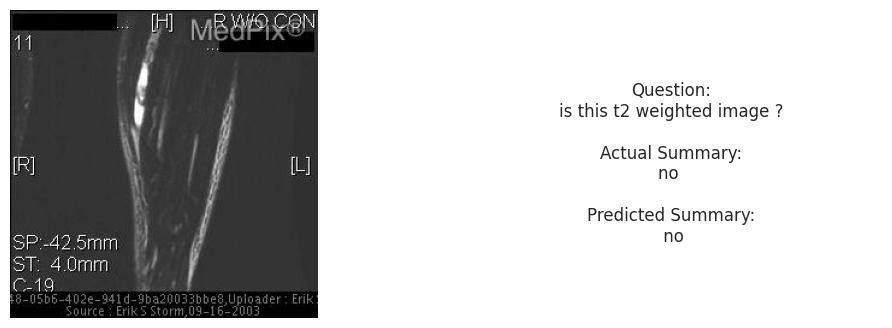

-----------------


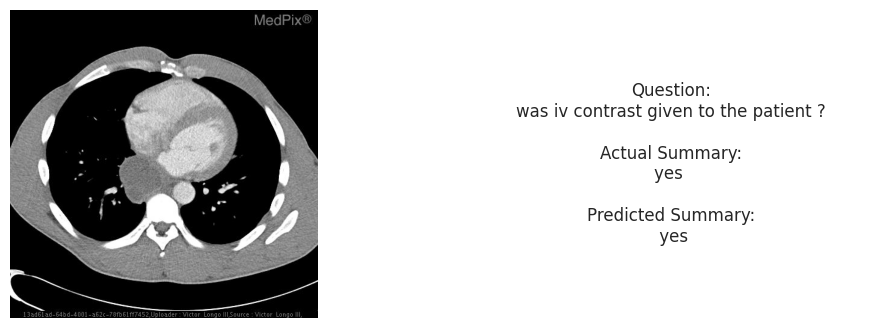

-----------------


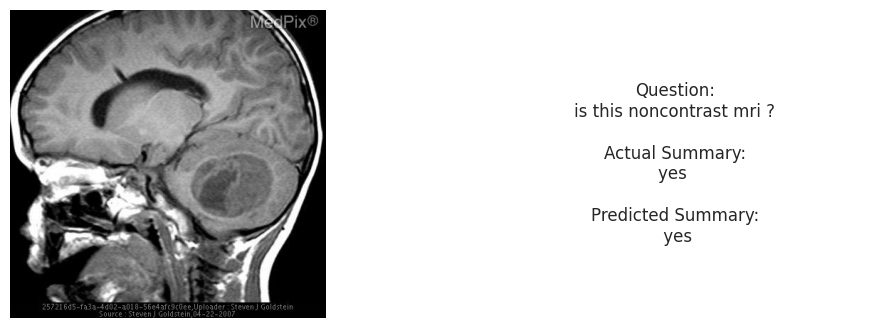

-----------------


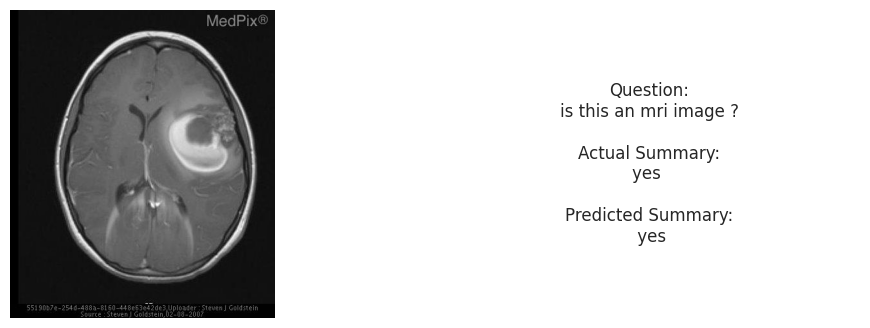

-----------------


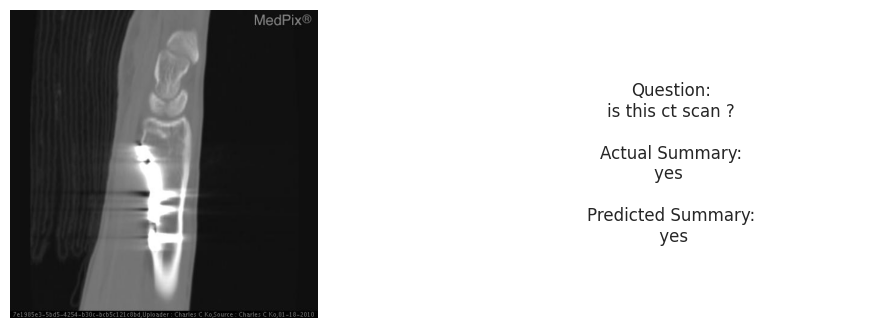

-----------------


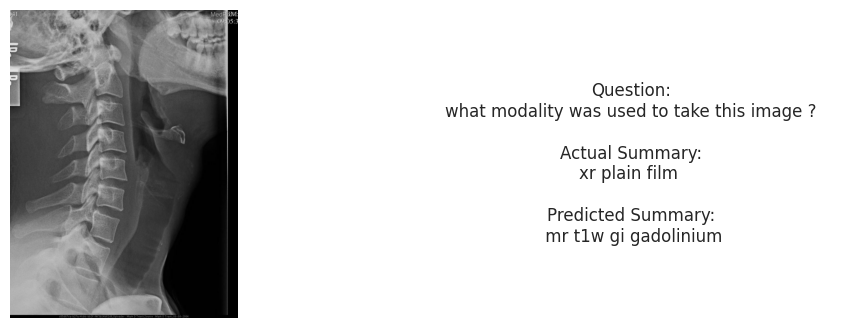

-----------------


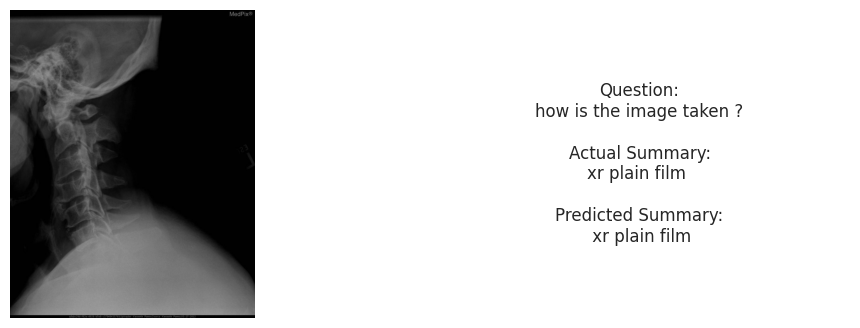

-----------------


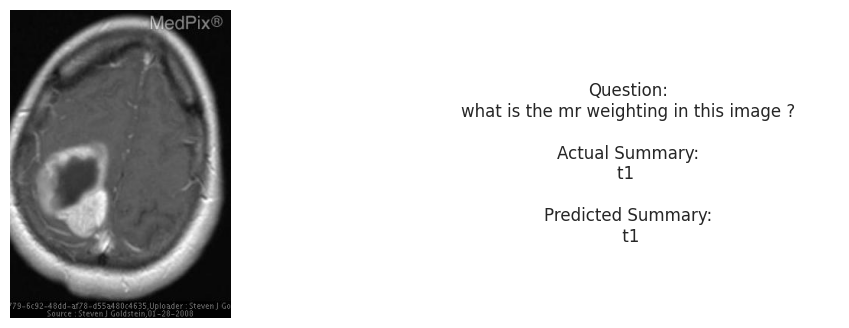

-----------------


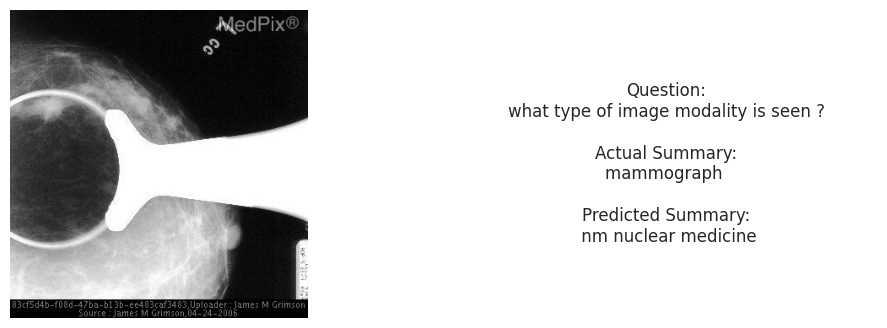

-----------------


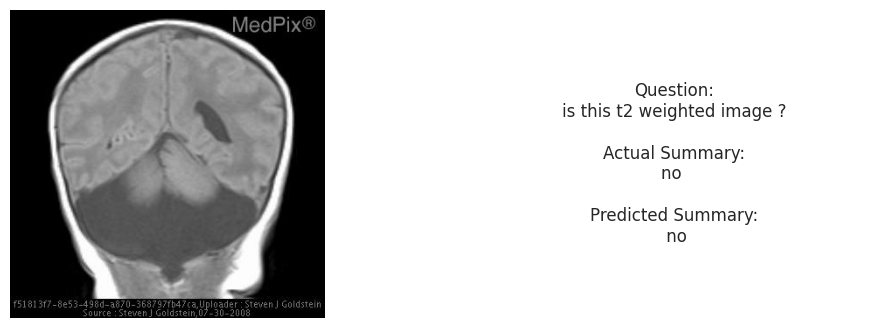

-----------------


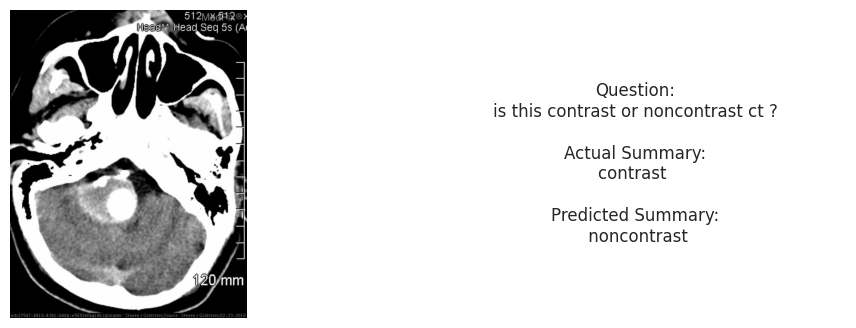

-----------------


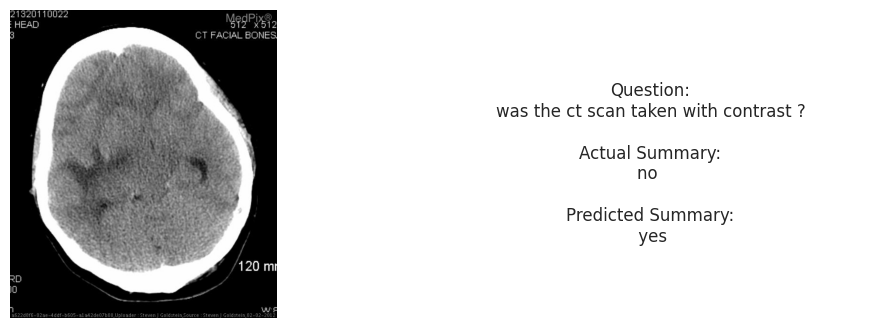

-----------------


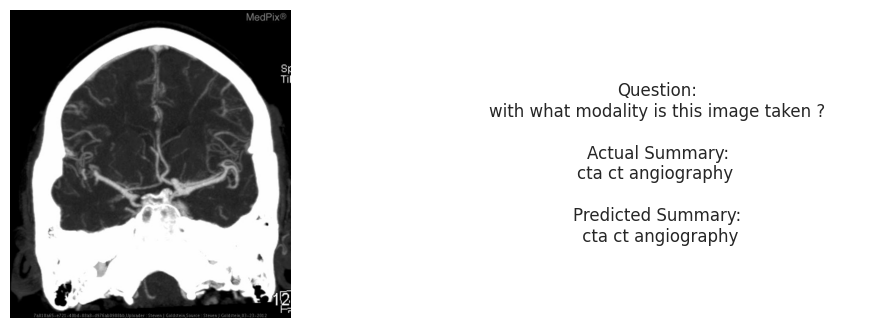

-----------------


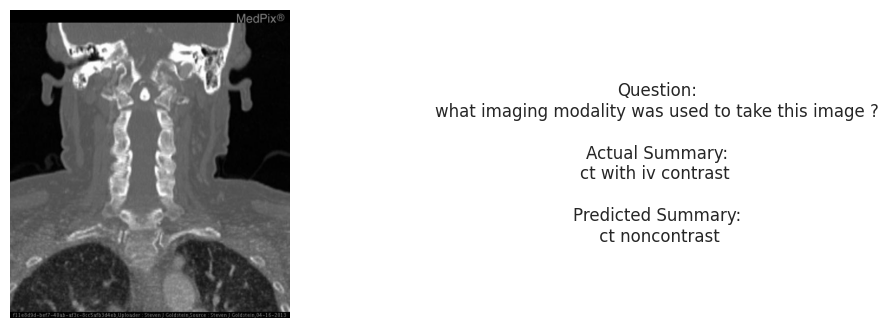

-----------------


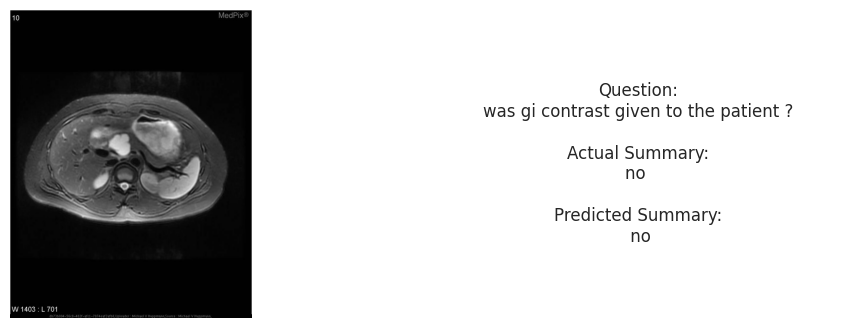

-----------------


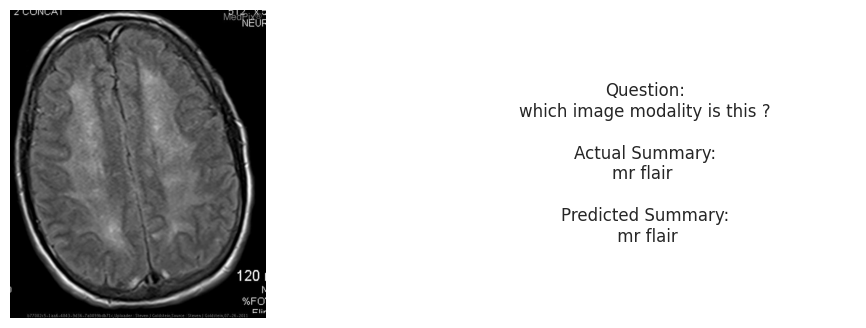

-----------------


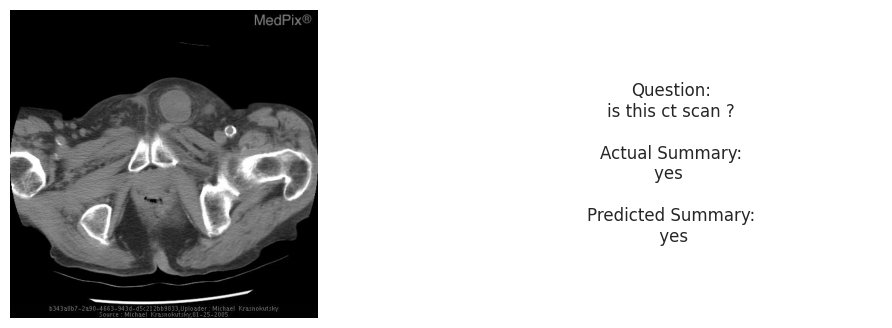

-----------------


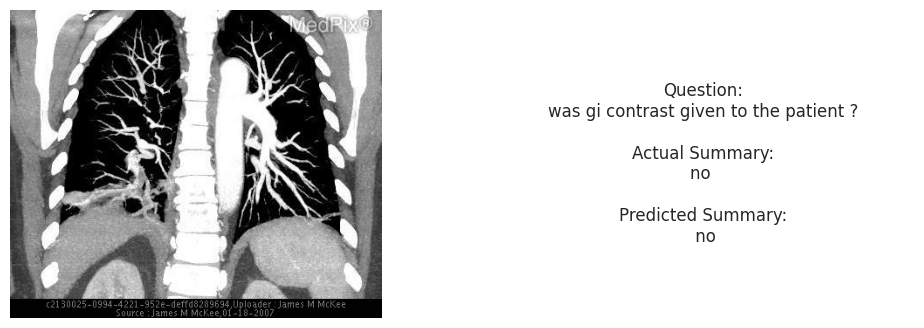

-----------------


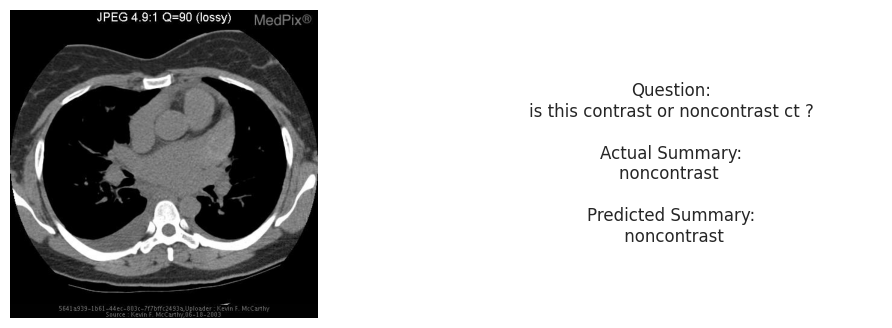

-----------------


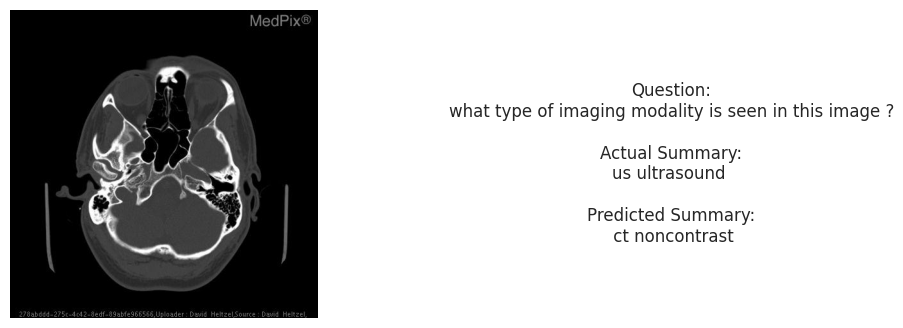

-----------------


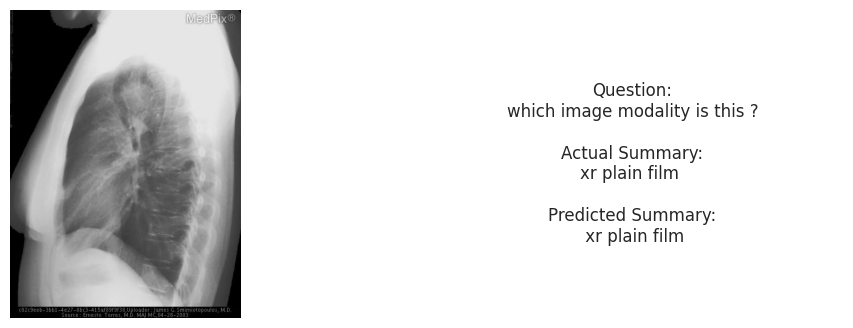

-----------------


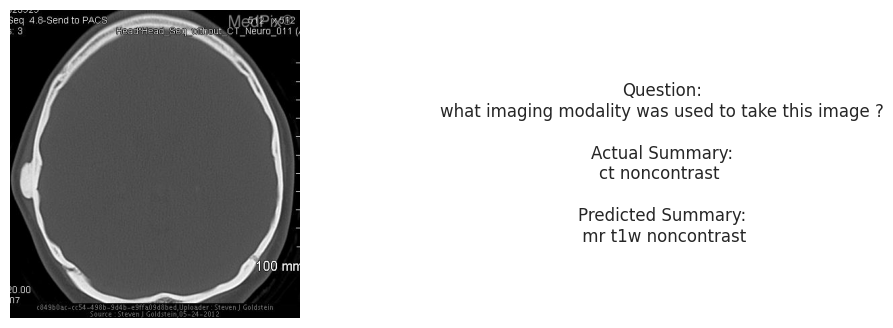

-----------------


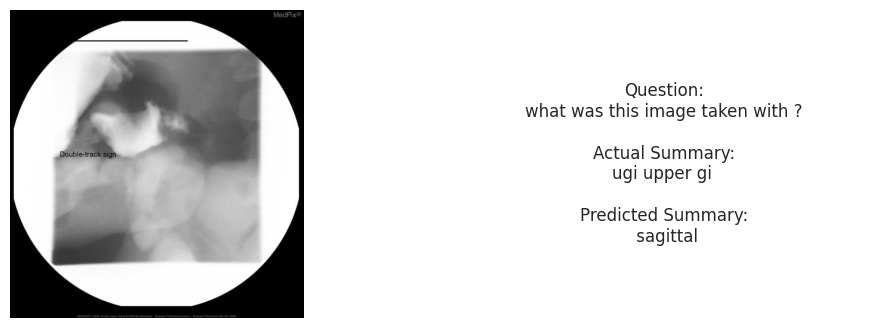

-----------------


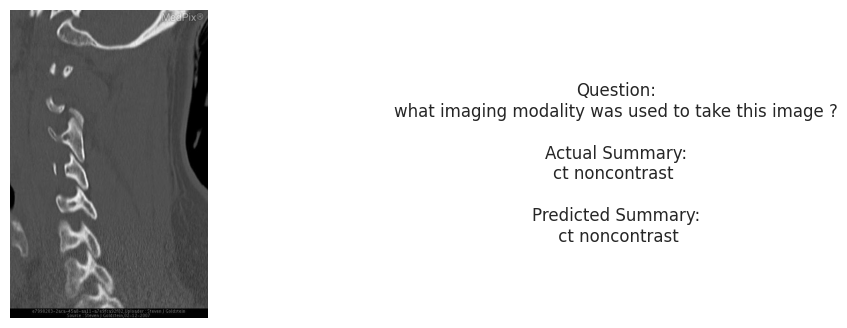

-----------------


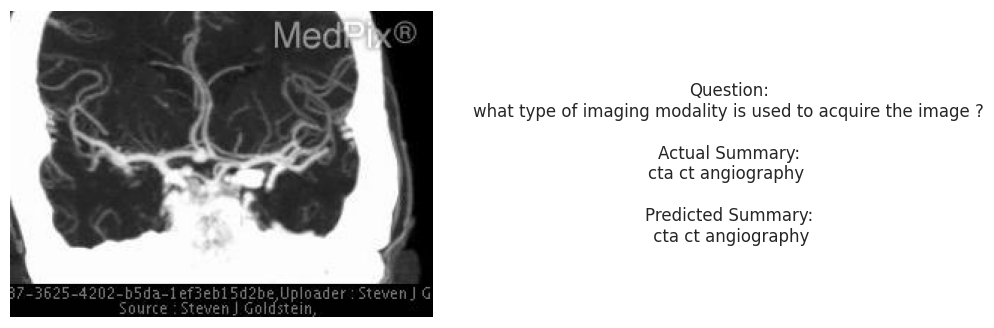

-----------------


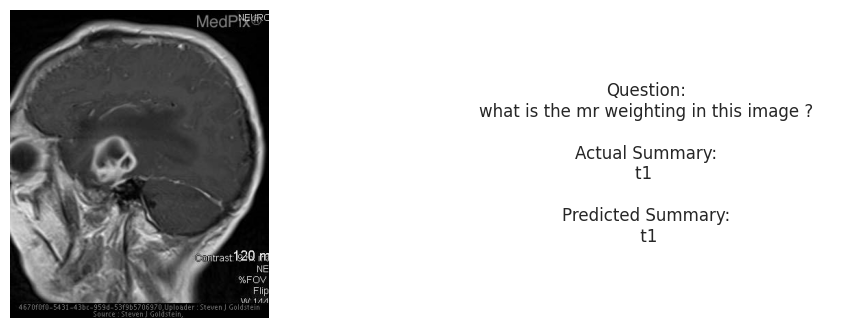

-----------------


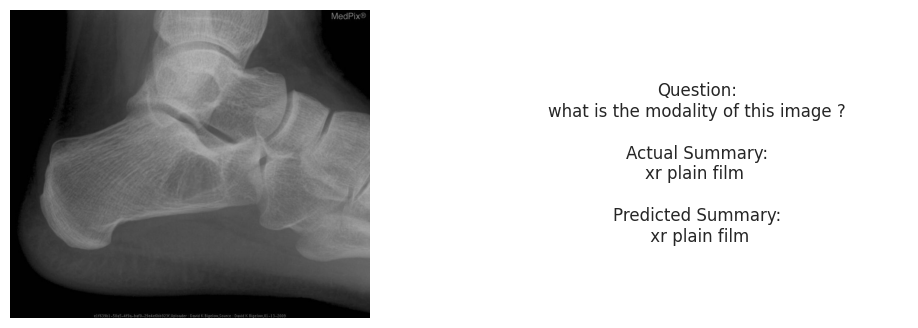

-----------------


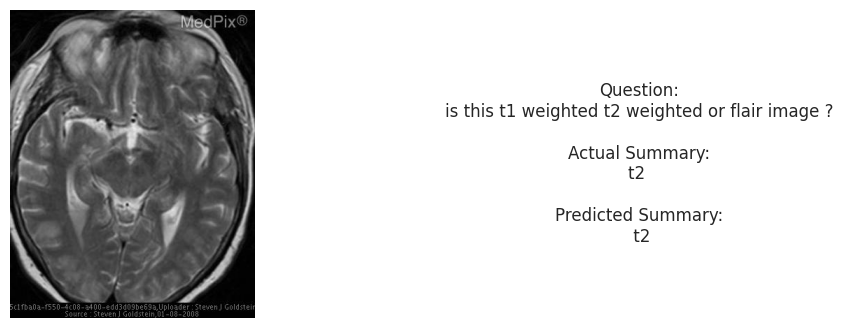

-----------------


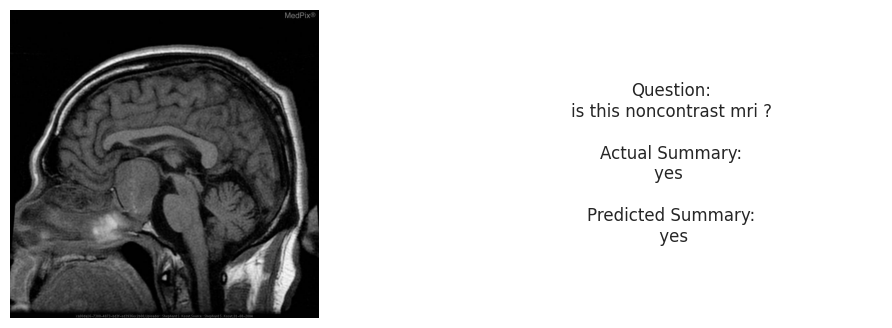

-----------------


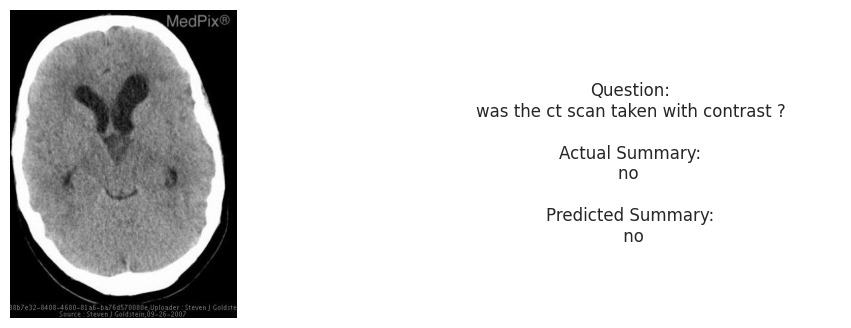

-----------------


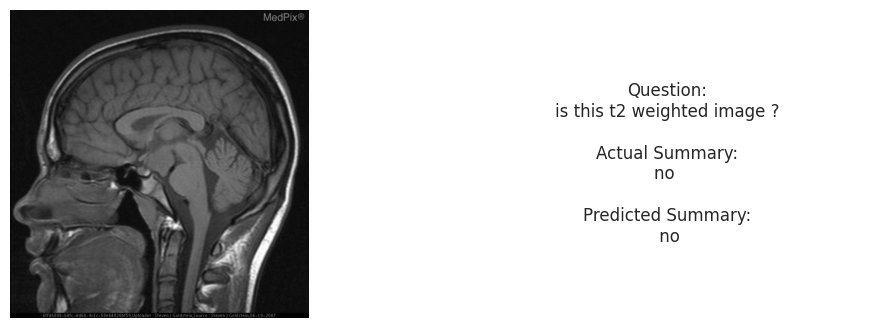

-----------------


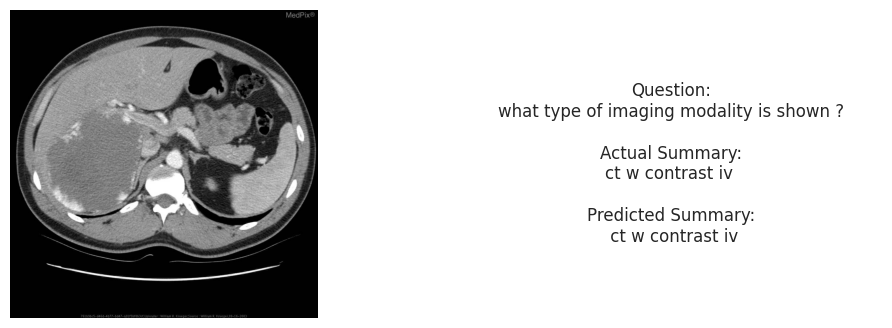

-----------------


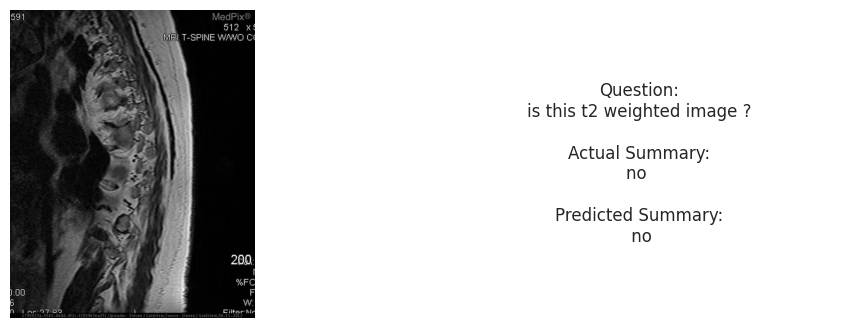

-----------------


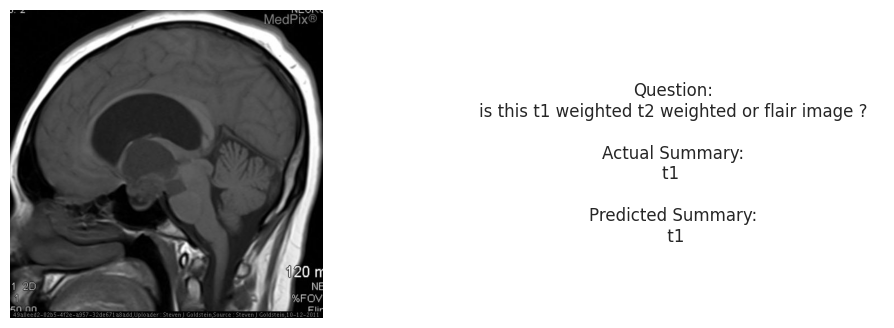

-----------------


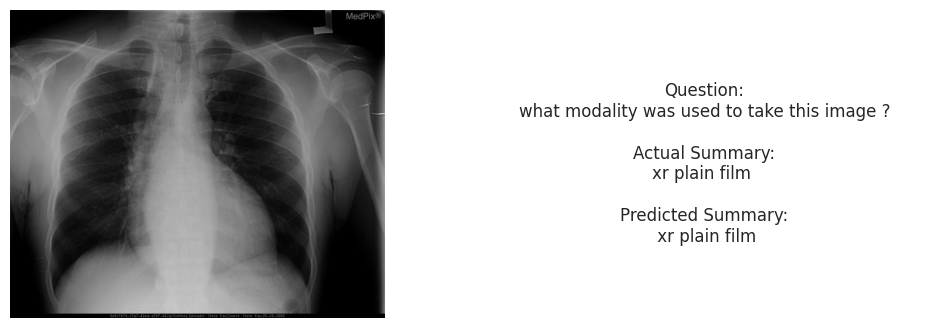

-----------------


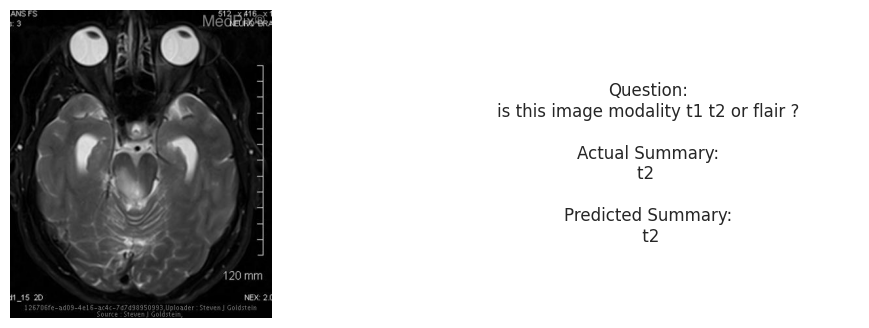

-----------------


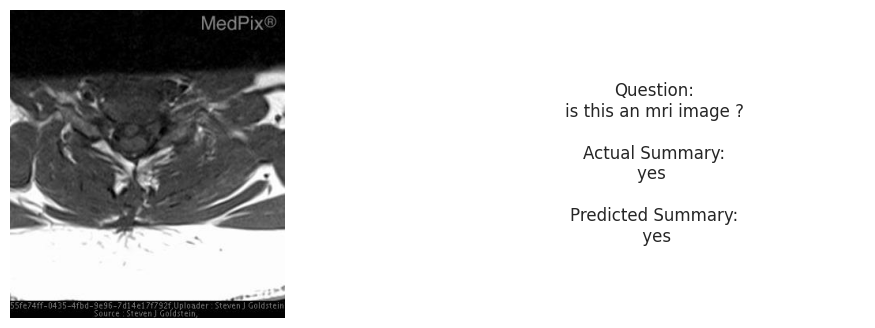

-----------------


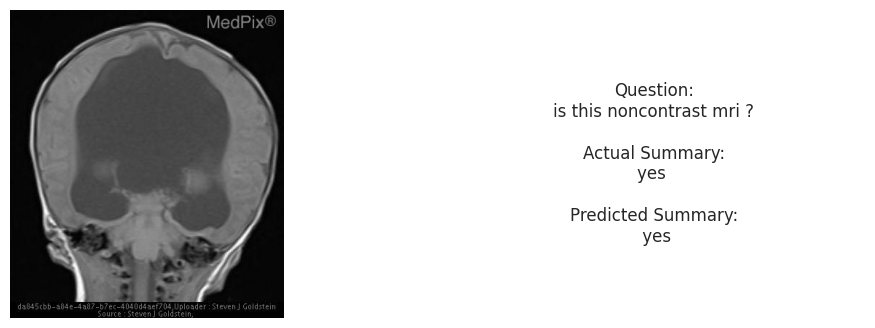

-----------------


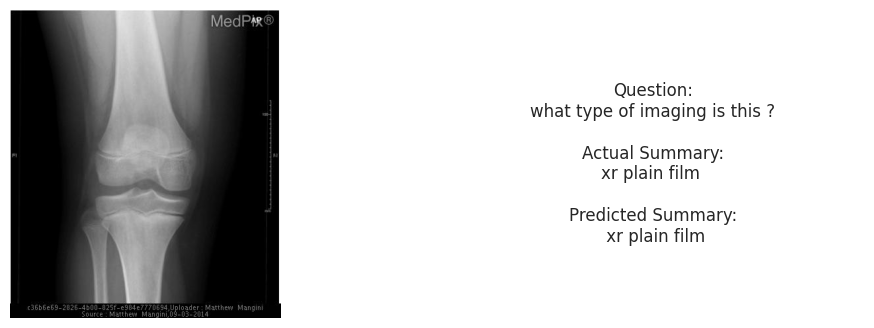

-----------------


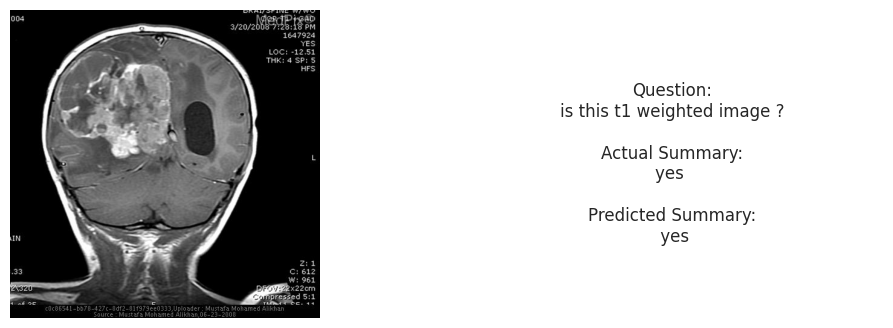

-----------------


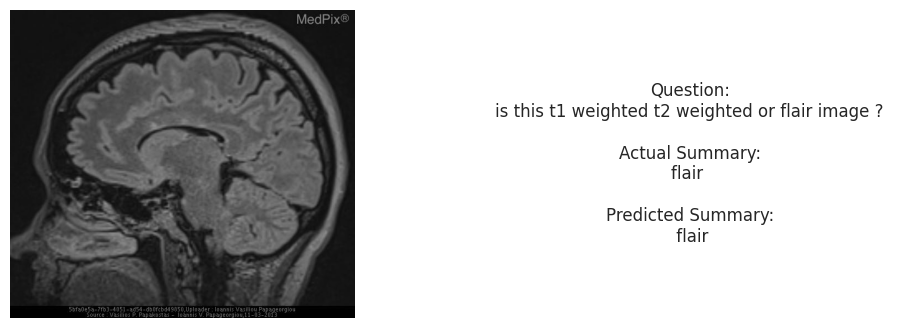

-----------------


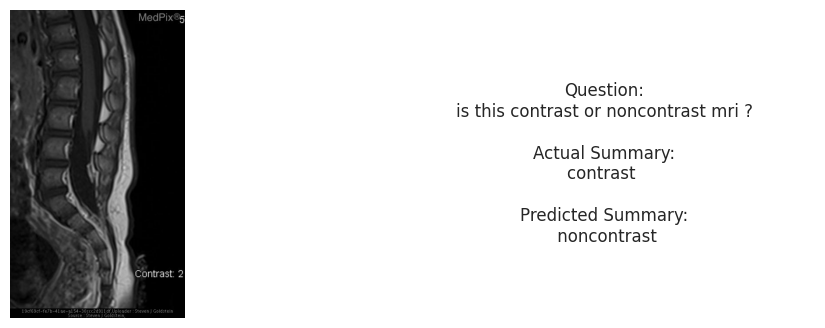

-----------------


In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def plot_image(image_path, question, actual_summary, predicted_summary):
    img = mpimg.imread(image_path)
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    axs[0].imshow(img)
    axs[0].axis('off')  # Turn off axis labels

    axs[1].text(0.5, 0.5, f"Question:\n{question}\n\nActual Summary:\n{actual_summary}\n\nPredicted Summary:\n{predicted_summary}",
               horizontalalignment='center',
               verticalalignment='center',
               fontsize=12,
               wrap=True)
    axs[1].axis('off')  # Turn off axis labels

    plt.show()

for i in range(400, 500):
    image_path = val_image_paths[i]
    question = seq2text(x_val_pad[i])
    actual_summary = seq2summary(y_val_pad[i])[6:-4]
    predicted_summary = decode_sequence(x_val_pad[i].reshape(1, 11), get_images(image_path))[6:-4]
    plot_image(image_path,question+"?",actual_summary,predicted_summary)
    print("-----------------")


In [21]:
abnormality_file_path = './VQA-Med-Validation/QAPairsByCategory/C4_Abnormality_val.txt'

# Read the text file into a list of lines
with open(abnormality_file_path, 'r') as file:
    lines = file.readlines()

# Use list comprehension to split lines and create a list of dictionaries
data_list = [line.strip().split('|') for line in lines]

# Create a DataFrame directly from the list of dictionaries
abnormality_qa_df = pd.DataFrame(data_list, columns=['image', 'question', 'answer'])

# Apply data cleaning and preprocessing
abnormality_qa_df["cleaned_question"] = abnormality_qa_df["question"].apply(lambda x: text_strip(x))
abnormality_qa_df["cleaned_answer"] = abnormality_qa_df["answer"].apply(lambda x: '_START_ '+ text_strip(x) + ' _END_')
abnormality_qa_df["cleaned_answer"] = abnormality_qa_df["cleaned_answer"].apply(lambda x: 'sostok '+x+' eostok')

# Filter based on sequence length
abnormality_qa = abnormality_qa_df[((abnormality_qa_df.cleaned_question.str.split().str.len() <= 11) &
                                    (abnormality_qa_df.cleaned_answer.str.split().str.len() <= 15))].copy()
abnormality_qa = abnormality_qa.reset_index(drop=True)

# Rename columns
abnormality_qa = abnormality_qa.drop(['question', 'answer'], axis=1)
abnormality_qa = abnormality_qa.rename(columns={'cleaned_question': 'question', 'cleaned_answer': 'answer'})

# Tokenization and padding
x_abnormality_seq = x_tokenizer.texts_to_sequences(abnormality_qa['question'])
x_abnormality_pad = pad_sequences(x_abnormality_seq, maxlen=11, padding='post')

y_abnormality_seq = y_tokenizer.texts_to_sequences(abnormality_qa['answer'])
y_abnormality_pad = pad_sequences(y_abnormality_seq, maxlen=11, padding='post')

# Image paths
abnormality_image_paths = []
for i in abnormality_qa['image']:
    abnormality_image_paths.append('VQA-Med-Validation/Val_images/' + i + '.jpg')


In [22]:
organ_file_path = './VQA-Med-Validation/QAPairsByCategory/C3_Organ_val.txt'

# Read the text file into a list of lines
with open(organ_file_path, 'r') as file:
    lines = file.readlines()

# Use list comprehension to split lines and create a list of dictionaries
data_list = [line.strip().split('|') for line in lines]

# Create a DataFrame directly from the list of dictionaries
organ_qa_df = pd.DataFrame(data_list, columns=['image', 'question', 'answer'])

# Apply data cleaning and preprocessing
organ_qa_df["cleaned_question"] = organ_qa_df["question"].apply(lambda x: text_strip(x))
organ_qa_df["cleaned_answer"] = organ_qa_df["answer"].apply(lambda x: '_START_ '+ text_strip(x) + ' _END_')
organ_qa_df["cleaned_answer"] = organ_qa_df["cleaned_answer"].apply(lambda x: 'sostok '+x+' eostok')

# Filter based on sequence length
organ_qa = organ_qa_df[((organ_qa_df.cleaned_question.str.split().str.len() <= 11) &
                        (organ_qa_df.cleaned_answer.str.split().str.len() <= 15))].copy()
organ_qa = organ_qa.reset_index(drop=True)

# Rename columns
organ_qa = organ_qa.drop(['question', 'answer'], axis=1)
organ_qa = organ_qa.rename(columns={'cleaned_question': 'question', 'cleaned_answer': 'answer'})

# Tokenization and padding
x_organ_seq = x_tokenizer.texts_to_sequences(organ_qa['question'])
x_organ_pad = pad_sequences(x_organ_seq, maxlen=11, padding='post')

y_organ_seq = y_tokenizer.texts_to_sequences(organ_qa['answer'])
y_organ_pad = pad_sequences(y_organ_seq, maxlen=11, padding='post')

# Image paths
organ_image_paths = []
for i in organ_qa['image']:
    organ_image_paths.append('VQA-Med-Validation/Val_images/' + i + '.jpg')


In [23]:
plane_file_path = './VQA-Med-Validation/QAPairsByCategory/C2_Plane_val.txt'

# Read the text file into a list of lines
with open(plane_file_path, 'r') as file:
    lines = file.readlines()

# Use list comprehension to split lines and create a list of dictionaries
data_list = [line.strip().split('|') for line in lines]

# Create a DataFrame directly from the list of dictionaries
plane_qa_df = pd.DataFrame(data_list, columns=['image', 'question', 'answer'])

# Apply data cleaning and preprocessing
plane_qa_df["cleaned_question"] = plane_qa_df["question"].apply(lambda x: text_strip(x))
plane_qa_df["cleaned_answer"] = plane_qa_df["answer"].apply(lambda x: '_START_ '+ text_strip(x) + ' _END_')
plane_qa_df["cleaned_answer"] = plane_qa_df["cleaned_answer"].apply(lambda x: 'sostok '+x+' eostok')

# Filter based on sequence length
plane_qa = plane_qa_df[((plane_qa_df.cleaned_question.str.split().str.len() <= 11) &
                        (plane_qa_df.cleaned_answer.str.split().str.len() <= 15))].copy()
plane_qa = plane_qa.reset_index(drop=True)

# Rename columns
plane_qa = plane_qa.drop(['question', 'answer'], axis=1)
plane_qa = plane_qa.rename(columns={'cleaned_question': 'question', 'cleaned_answer': 'answer'})

# Tokenization and padding
x_plane_seq = x_tokenizer.texts_to_sequences(plane_qa['question'])
x_plane_pad = pad_sequences(x_plane_seq, maxlen=11, padding='post')

y_plane_seq = y_tokenizer.texts_to_sequences(plane_qa['answer'])
y_plane_pad = pad_sequences(y_plane_seq, maxlen=11, padding='post')

# Image paths
plane_image_paths = []
for i in plane_qa['image']:
    plane_image_paths.append('VQA-Med-Validation/Val_images/' + i + '.jpg')


In [24]:
modality_file_path = './VQA-Med-Validation/QAPairsByCategory/C1_Modality_val.txt'

# Read the text file into a list of lines
with open(modality_file_path, 'r') as file:
    lines = file.readlines()

# Use list comprehension to split lines and create a list of dictionaries
data_list = [line.strip().split('|') for line in lines]

# Create a DataFrame directly from the list of dictionaries
modality_qa_df = pd.DataFrame(data_list, columns=['image', 'question', 'answer'])

# Apply data cleaning and preprocessing
modality_qa_df["cleaned_question"] = modality_qa_df["question"].apply(lambda x: text_strip(x))
modality_qa_df["cleaned_answer"] = modality_qa_df["answer"].apply(lambda x: '_START_ '+ text_strip(x) + ' _END_')
modality_qa_df["cleaned_answer"] = modality_qa_df["cleaned_answer"].apply(lambda x: 'sostok '+x+' eostok')

# Filter based on sequence length
modality_qa = modality_qa_df[((modality_qa_df.cleaned_question.str.split().str.len() <= 11) &
                              (modality_qa_df.cleaned_answer.str.split().str.len() <= 15))].copy()
modality_qa = modality_qa.reset_index(drop=True)

# Rename columns
modality_qa = modality_qa.drop(['question', 'answer'], axis=1)
modality_qa = modality_qa.rename(columns={'cleaned_question': 'question', 'cleaned_answer': 'answer'})

# Tokenization and padding
x_modality_seq = x_tokenizer.texts_to_sequences(modality_qa['question'])
x_modality_pad = pad_sequences(x_modality_seq, maxlen=11, padding='post')

y_modality_seq = y_tokenizer.texts_to_sequences(modality_qa['answer'])
y_modality_pad = pad_sequences(y_modality_seq, maxlen=11, padding='post')

# Image paths
modality_image_paths = []
for i in modality_qa['image']:
    modality_image_paths.append('VQA-Med-Validation/Val_images/' + i + '.jpg')


In [25]:
from tqdm import tqdm

def calculate_accuracy(input_seqs, img_seqs, target_seqs):
    correct_predictions = 0
    total_samples = len(input_seqs)

    for i in tqdm(range(total_samples), desc="Calculating Accuracy", unit="sample"):
        input_seq = input_seqs[i].reshape(1, 11)
        img = img_seqs[i]
        target_seq = seq2summary(target_seqs[i])

        predicted_sequence = decode_sequence(input_seq, get_images(img))

        # Assuming target_seq is a string, you can compare it with the predicted sequence
        if target_seq.strip() == predicted_sequence.strip():
            correct_predictions += 1

    accuracy = correct_predictions / total_samples
    return accuracy


In [26]:
from nltk.translate.bleu_score import corpus_bleu

def calculate_bleu_score(input_seqs, img_seqs, target_seqs):
    references = []
    hypotheses = []
    total_samples = len(input_seqs)
    for i in tqdm(range(total_samples), desc="Calculating Bleu", unit="sample"):
        input_seq = input_seqs[i].reshape(1, 11)
        img = img_seqs[i]
        target_seq = seq2summary(target_seqs[i])

        predicted_sequence = decode_sequence(input_seq, get_images(img))

        references.append([target_seq.split()])
        hypotheses.append(predicted_sequence.split())

    bleu_score = corpus_bleu(references, hypotheses)
    return bleu_score


In [28]:
from tqdm import tqdm

def calculate_accuracy_batched(input_seqs, img_seqs, target_seqs, batch_size):
    correct_predictions = 0
    total_samples = len(input_seqs)

    for i in tqdm(range(0, total_samples, batch_size), desc="Calculating Accuracy", unit="batch"):
        input_batch = input_seqs[i:i+batch_size]
        img_batch = img_seqs[i:i+batch_size]
        target_batch = target_seqs[i:i+batch_size]

        for j in range(len(input_batch)):
            input_seq = input_batch[j].reshape(1, 11)
            img = img_batch[j]
            target_seq = seq2summary(target_batch[j])

            predicted_sequence = decode_sequence(input_seq, get_images(img))

            # Assuming target_seq is a string, you can compare it with the predicted sequence
            if target_seq.strip() == predicted_sequence.strip():
                correct_predictions += 1

    accuracy = correct_predictions / total_samples
    return accuracy


def calculate_bleu_score_batched(input_seqs, img_seqs, target_seqs, batch_size):
    references = []
    hypotheses = []

    total_samples = len(input_seqs)

    for i in tqdm(range(0, total_samples, batch_size), desc="Calculating Bleu score", unit="batch"):
        input_batch = input_seqs[i:i+batch_size]
        img_batch = img_seqs[i:i+batch_size]
        target_batch = target_seqs[i:i+batch_size]

        for j in range(len(input_batch)):
            input_seq = input_batch[j].reshape(1, 11)
            img = img_batch[j]
            target_seq = seq2summary(target_batch[j])

            predicted_sequence = decode_sequence(input_seq, get_images(img))

            references.append([seq2summary(target_seq).split()])
            hypotheses.append(predicted_sequence.split())

    bleu_score = corpus_bleu(references, hypotheses)
    return bleu_score

In [ ]:
accuracy_modality = calculate_accuracy(x_modality_pad,modality_image_paths,y_modality_pad)

bleu_score_modality = calculate_bleu_score(x_modality_pad,modality_image_paths,y_modality_pad)

accuracy_plane = calculate_accuracy(x_plane_pad,plane_image_paths,y_plane_pad)

bleu_score_plane = calculate_bleu_score(x_plane_pad,plane_image_paths,y_plane_pad)

accuracy_organ = calculate_accuracy(x_organ_pad,organ_image_paths,y_organ_pad)

bleu_score_organ = calculate_bleu_score(x_organ_pad,organ_image_paths,y_organ_pad)

accuracy_abnormality = calculate_accuracy(x_abnormality_pad,abnormality_image_paths,y_abnormality_pad)

bleu_score_abnormality = calculate_bleu_score(x_abnormality_pad,abnormality_image_paths,y_abnormality_pad)

# Print or use the accuracy and BLEU score for each category
print(f"Modality Accuracy: {accuracy_modality * 100:.2f}%")
print(f"Modality BLEU Score: {bleu_score_modality * 100:.2f}%")

print(f"Plane Accuracy: {accuracy_plane * 100:.2f}%")
print(f"Plane BLEU Score: {bleu_score_plane * 100:.2f}%")

print(f"Organ Accuracy: {accuracy_organ * 100:.2f}%")
print(f"Organ BLEU Score: {bleu_score_organ * 100:.2f}%")

print(f"Abnormality Accuracy: {accuracy_abnormality * 100:.2f}%")
print(f"Abnormality BLEU Score: {bleu_score_abnormality * 100:.2f}%")

Calculating Accuracy:  75%|███████▌  | 375/497 [06:46<56:57, 28.01s/sample]